In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import os
import sys
sys.path.insert(0, '..')
from titan.Experiment import Experiment
from titan.plt_Experiment_summary import titan_plt_summary, titan_plt_summary_temp
from titan.load_and_preprocessing import titan_load_and_preprocessing
import sigmoid_fitting as sp
from titan.processing_DNA import titan_plt_infl

import pickle

# 1. Data Loading

In [113]:
n_wells = 10
n_a_type = "v04"
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_paths = [Path(exp_folder, "D20250808_E00_C00_F4500KHz_U_Sample_7")]

DEBUG: EXP_PATHS
i_path 0, path /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7

-------
DEBUG: RUN N 0 -- NWELLS 10 -- N_A_TYPE v04
EXP PATH /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7 
READOUT PATH /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/20250808T113224.62_readout_time.bin 
Load data... 
Image gain_summary.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7 saved.


/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:48: RuntimeWarning: divide by zero encountered in log
  log_div = np.log((tau_i - C) / A) / np.log((tau_f - C) / A)  # Intermediate operation
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:48: RuntimeWarning: invalid value encountered in divide
  log_div = np.log((tau_i - C) / A) / np.log((tau_f - C) / A)  # Intermediate operation
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:49: RuntimeWarning: divide by zero encountered in divide
  D = (V_i - (log_div * V_f)) / (1 - log_div)  # Calculate D
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-mai

Data loaded. 
Preprocessing start...
DEBUG START_SETTLED_END: idxstart 15, idxsettled 34, idxend 649
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7 saved.
Preprocessing end.


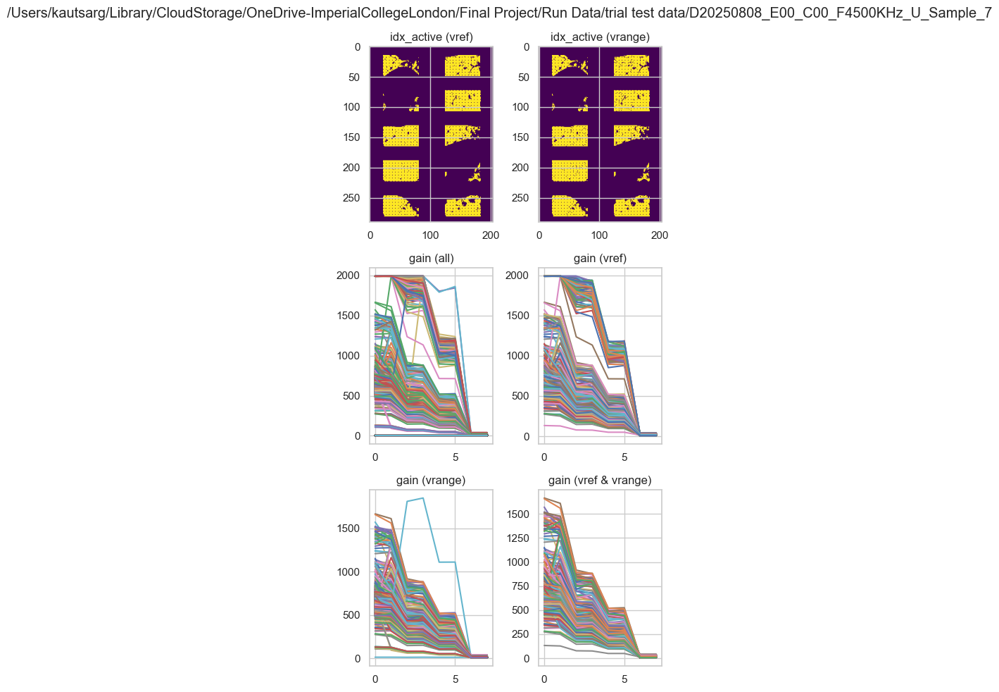

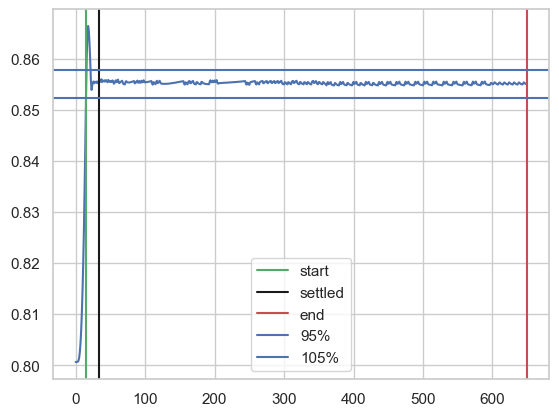

In [3]:
print(f"DEBUG: EXP_PATHS")
for i_path in range(len(exp_paths)):
    print(f"i_path {i_path}, path {exp_paths[i_path]}")

for i_path, exp_path in enumerate(exp_paths):
    path_readout_str = str(exp_path)
    print(f"\n-------\nDEBUG: RUN N {i_path} -- NWELLS {n_wells} -- N_A_TYPE {n_a_type}")

    exp = titan_load_and_preprocessing(exp_path, n_wells=n_wells, start_type="temperature",
                                        end_time_min=60, n_a_type=n_a_type,
                                        print_status=True, plt_gain_calib=False, save_gain_calib=True)

    # titan_plt_summary(exp, exp_path, plt_save=True)
    # titan_plt_summary_temp(exp, exp_path, plt_save=True)
    # titan_plt_infl(exp, exp_path, plt_show=True, plt_save=True)

In [115]:
for i, well in enumerate(exp.wells_list):
    print(well)

In [146]:
exp.wells_list[0].well_2d_npr.shape[1]

5916

In [153]:
exp.wells_list[0].well_2d_npr.shape

(650, 5916)

In [152]:
exp.wells_list[0].well_2d_bs_active.shape

(615, 818)

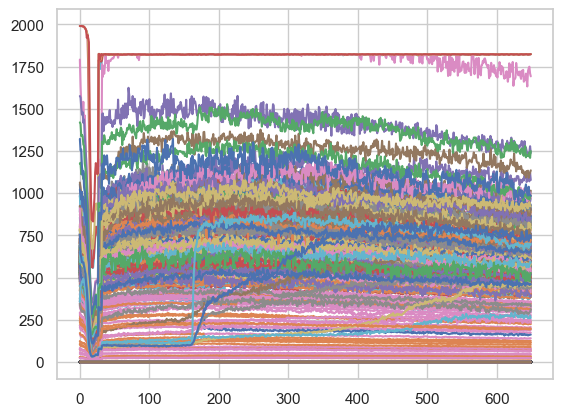

In [140]:
plt.plot(exp.wells_list[0].well_2d_npr)
plt.show()

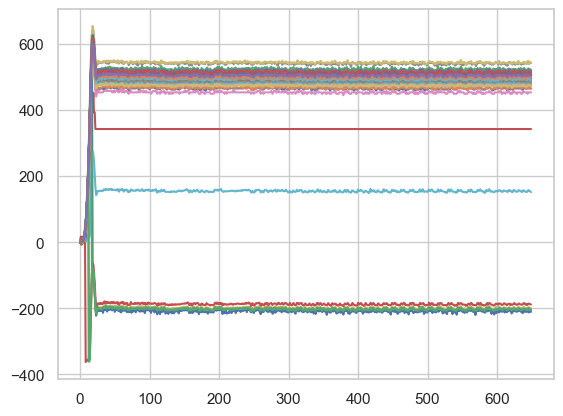

In [121]:
plt.plot(exp.wells_list[0].well_temp_lin2d)
plt.show()

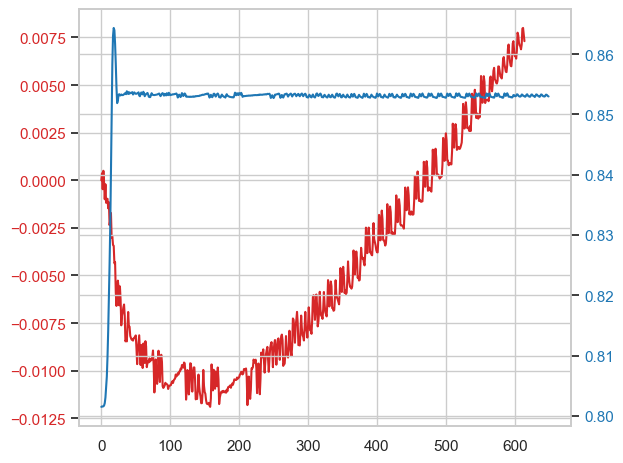

In [137]:
set_idx = 201
num_of_data = 1
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.plot(exp.wells_list[0].well_2d_bs_active_mean, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx() 

color = 'tab:blue'
ax2.plot(exp.wells_list[0].well_temp_mean_NEW, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

# 2. Data Profiling

In [4]:
def export_well_analysis(exp, output_dir='.'):
    well_stats = []
    total_pixels = 0
    total_active_pixels = 0
    
    for i, well in enumerate(exp.wells_list):
        n_well_pixels = well.well_nrows * well.well_ncols
        n_temp_pixels = well.well_temp_nrows * well.well_temp_ncols
        active_pixels = well.idx_active.sum()
        n_active_pixels = len(well.idx_active)
        active_pct = (active_pixels * 100 / n_active_pixels) if n_active_pixels > 0 else 0
        
        total_pixels += n_active_pixels
        total_active_pixels += active_pixels
        
        well_stats.append({
            'Well': f'Well-{i+1}',
            'well_nrows': well.well_nrows,
            'well_ncols': well.well_ncols,
            'well_total_pixels': n_well_pixels,
            'temp_nrows': well.well_temp_nrows,
            'temp_ncols': well.well_temp_ncols,
            'temp_total_pixels': n_temp_pixels,
            'active_pixels': active_pixels,
            'total_pixels': n_active_pixels,
            'active_percentage': f'{active_pct:.3f}%',
            'time_npr_shape': str(well.time_npr.shape),
            'well_3d_npr_shape': str(well.well_3d_npr.shape),
            'well_3d_temp_npr_shape': str(well.well_3d_temp_npr.shape),
            'well_3d_gain_shape': str(well.well_3d_gain.shape),
            'well_3d_lin_shape': str(well.well_3d_lin.shape),
            'idx_start': well.idx_start,
            'idx_settled': well.idx_settled,
            'idx_end': well.idx_end,
            'idx_active_shape': str(well.idx_active.shape),
        })
    
    df_wells = pd.DataFrame(well_stats)
    df_wells.to_csv(f'{output_dir}/well_statistics.csv', index=False)
    
    # SUMMARY
    total_active_pct = (total_active_pixels * 100 / total_pixels) if total_pixels > 0 else 0
    print(f"✓ Exported well statistics to: well_statistics.csv")
    print(f"\nTOTAL: {total_active_pixels}/{total_pixels} ({total_active_pct:.3f}%)")
    
    return df_wells

# Usage
df_stats = export_well_analysis(exp, exp_path)

✓ Exported well statistics to: well_statistics.csv

TOTAL: 12047/59160 (20.363%)


# 3. Data Preprocessing

In [5]:
def exp_to_X(exp_data: Experiment, param_str: str):   
    vstacked = None
    well_ids = []

    for i, well in enumerate(exp_data.wells_list):
        temp_x = getattr(well, param_str).copy()
        temp_x = np.swapaxes(temp_x, 0, 1)

        if vstacked is None:
            vstacked = temp_x
        else:
            vstacked = np.vstack((vstacked, temp_x))

        well_ids.append(getattr(well, param_str).shape[1])
    if vstacked is None:
        return np.empty((0, 638))

    return vstacked, well_ids

In [6]:
X_2d_bs_active, X_2d_bs_active_ids = exp_to_X(exp, "well_2d_bs_active")
# X_2d_nl_bs_active, X_2d_nl_bs_active_ids = exp_to_X(exp, "well_2d_nl_bs_active")
# X_2d_active, X_2d_active_ids = exp_to_X(exp, "well_2d_active")
# X_2d_nl_active, X_2d_nl_active_ids = exp_to_X(exp, "well_2d_nl_active")
# X_temp_lin2d, X_temp_lin2d_ids = exp_to_X(exp, "well_temp_lin2d")
X_time = exp.wells_list[0].time

print(f"X_2d_bs_active: {X_2d_bs_active.shape}")
# print(f"X_2d_nl_bs_active: {X_2d_nl_bs_active.shape}")
# print(f"X_2d_active: {X_2d_active.shape}")
# print(f"X_2d_nl_active: {X_2d_nl_active.shape}")
# print(f"X_temp_lin2d: {X_temp_lin2d.shape}")
print(f"X_time: {X_time.shape}")

Y_well = []
for label, count in enumerate(X_2d_bs_active_ids):
    Y_well.extend([label] * count)

Y_well = np.array(Y_well)


X_2d_bs_active: (12047, 615)
X_time: (615,)


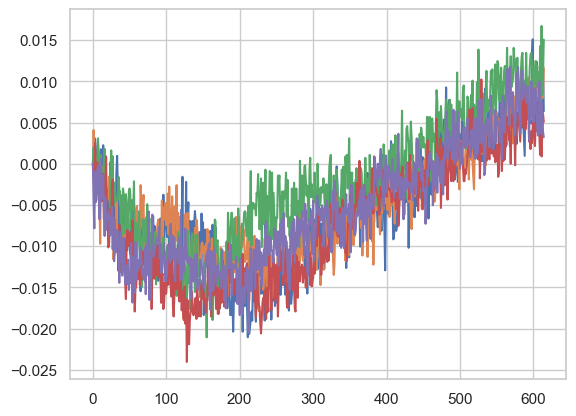

In [7]:
plt.plot(np.swapaxes(X_2d_bs_active[10:15,:], 1, 0))
plt.show()

In [8]:
# MODELS = ["2p", "3p", "4p", "5p", "gompertz", "weibull", "hill", "hill_norm", "boltzmann", "exponential"]
MODELS = ["4p", "5p", "weibull"]
KINETIC_PARAMS = [
    # Critical points
    'xms', 'xs', 'xe', 'xp1', 'xp2', 'TH',
    
    # Y-values
    'y_xms', 'y_xs', 'y_xe', 'y_xp1', 'y_xp2',
    
    # Derivative values
    'dy_xms', 'dy_xp1', 'dy_xp2', 'd2y_xp1', 'd2y_xp2',
    
    # TABLE S2: Distance metrics
    'threshold_distance',
    'first_half_distance',
    'second_half_distance',
    'distance_asymmetry_index',
    'peak_shifting_distance',
    
    # TABLE S2: Area metrics
    'A1',
    'A2',
    'area_asymmetry_index',
    
    # TABLE S2: Peak heights
    'peak_asymmetry_index',

    # OUTLIER DETECTION
    'Ct',
    'Cy0',
    'log_F0',

]

pickle_path = f'{exp_path}/kinetic_extract.pkl'

if (os.path.exists(pickle_path)):
    print(f"Load data from file: {pickle_path}")
    with open(pickle_path, 'rb') as file:
        results = pickle.load(file)
else:    
    print(f"Sigmoid fitting")
    results = {model: {"params": [], "fitted": [], "rmse": [], "1st_d": [], "2nd_d": []} for model in MODELS}

    for key in KINETIC_PARAMS:
        results["5p"][key] = []

    for model_name in MODELS:
        print(f"Fitting {model_name}...")
        fit_func = getattr(sp, f"fit_{model_name}")
        sigmoid_func = getattr(sp, f"sigmoid_{model_name}")

        for i in range(X_2d_bs_active.shape[0]):
            params, result = fit_func(X_time, X_2d_bs_active[i, :], normalize=True)
            fitted = sigmoid_func(X_time, *params)
            rmse = np.sqrt(np.nanmean((fitted - X_2d_bs_active[i, :])**2))

            results[model_name]["params"].append(params)
            results[model_name]["fitted"].append(fitted)
            results[model_name]["rmse"].append(rmse)

            if(model_name == "5p"):
                dy_dx = sp.sigmoid_5p_first_derivative(X_time, *params)
                d2y_dx2 = sp.sigmoid_5p_second_derivative(X_time, *params)
                
                results[model_name]["1st_d"].append(dy_dx)
                results[model_name]["2nd_d"].append(d2y_dx2)
                
                # Extract kinetic parameters
                kinetic = sp.extract_kinetic_parameters(X_time, fitted, params, threshold=0.05)
                
                # Store kinetic parameters
                for key in KINETIC_PARAMS:
                    results[model_name][key].append(kinetic[key])
            
        print(f"  ✓ Completed")
        
    for model_name in MODELS:
        for r in results[model_name]:
            results[model_name][r] = np.array(results[model_name][r])

    pickle_path = f'{exp_path}/kinetic_extract.pkl'
    with open(pickle_path, 'wb') as f:
        pickle.dump(results, f)
    print(f"✓ Pickle saved: {pickle_path}")

Sigmoid fitting
Fitting 4p...
  ✓ Completed
Fitting 5p...


/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/sigmoid_fitting.py:40: RuntimeWarning: overflow encountered in power
  return Fm / (1.0 + np.exp(-Sc * (x - Cs)))**As + Fb
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/sigmoid_fitting.py:99: RuntimeWarning: overflow encountered in power
  denominator = (1.0 + exp_term)**(As + 1)
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/sigmoid_fitting.py:107: RuntimeWarning: overflow encountered in multiply
  numerator = Fm * As * Sc**2 * exp_term * (As * exp_term - 1)
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/sigmoid_fitting.py:108: RuntimeWarning: overflow encountered in power
  denominator = (1.

  ✓ Completed
Fitting weibull...
  ✓ Completed
✓ Pickle saved: /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/kinetic_extract.pkl


/var/folders/xt/t6fw9lz91vg0ryq45tpjcjpc0000gn/T/ipykernel_38626/2343635388.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(rmse_data, labels=MODELS, patch_artist=True)


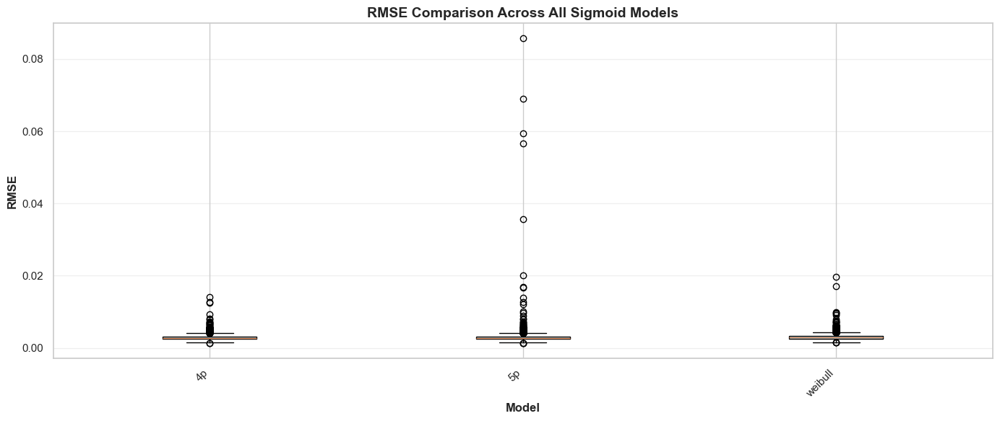

In [9]:
rmse_data = [results[model]["rmse"] for model in MODELS]

fig, ax = plt.subplots(figsize=(14, 6))
bp = ax.boxplot(rmse_data, labels=MODELS, patch_artist=True)

for patch in bp['boxes']:
    patch.set_facecolor('lightblue')

ax.set_xlabel('Model', fontsize=12, fontweight='bold')
ax.set_ylabel('RMSE', fontsize=12, fontweight='bold')
ax.set_title('RMSE Comparison Across All Sigmoid Models', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

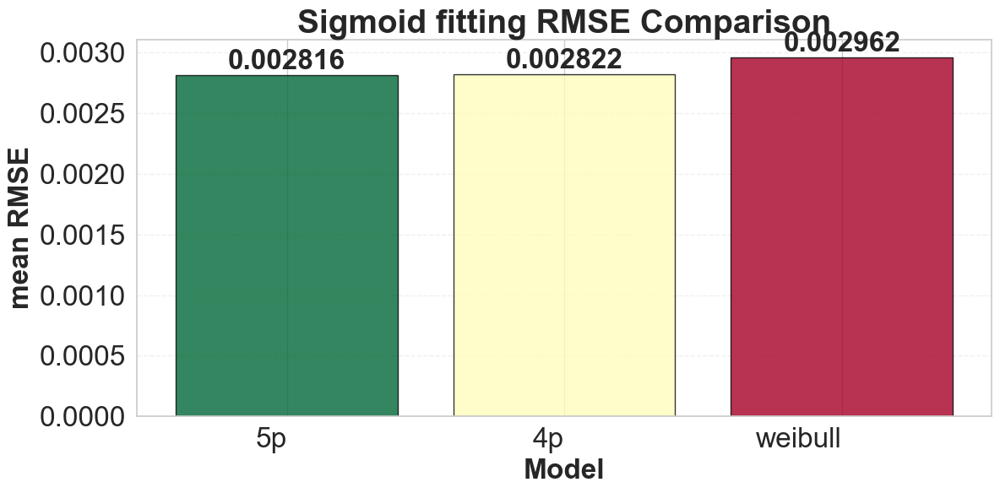

In [10]:
fig, ax = plt.subplots(figsize=(12, 6))

medians = [np.mean(rmse_data[i]) for i in range(len(MODELS))]

# Sort by median RMSE
sorted_indices = np.argsort(medians)
sorted_models = [MODELS[i] for i in sorted_indices]
sorted_medians = [medians[i] for i in sorted_indices]

colors = plt.cm.RdYlGn_r(np.linspace(0, 1, len(sorted_models)))
bars = ax.bar(sorted_models, sorted_medians, color=colors, alpha=0.8, edgecolor='black', linewidth=1)

# Add labels
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.6f}',
            ha='center', va='bottom', fontsize=24, fontweight='bold')

ax.set_ylabel('mean RMSE', fontsize=24, fontweight='bold')
ax.set_xlabel('Model', fontsize=24, fontweight='bold')
ax.set_title('Sigmoid fitting RMSE Comparison', fontsize=28, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y', linestyle='--')

plt.yticks(fontsize=24)
plt.xticks(ha='right', fontsize=24)
plt.tight_layout()
plt.show()

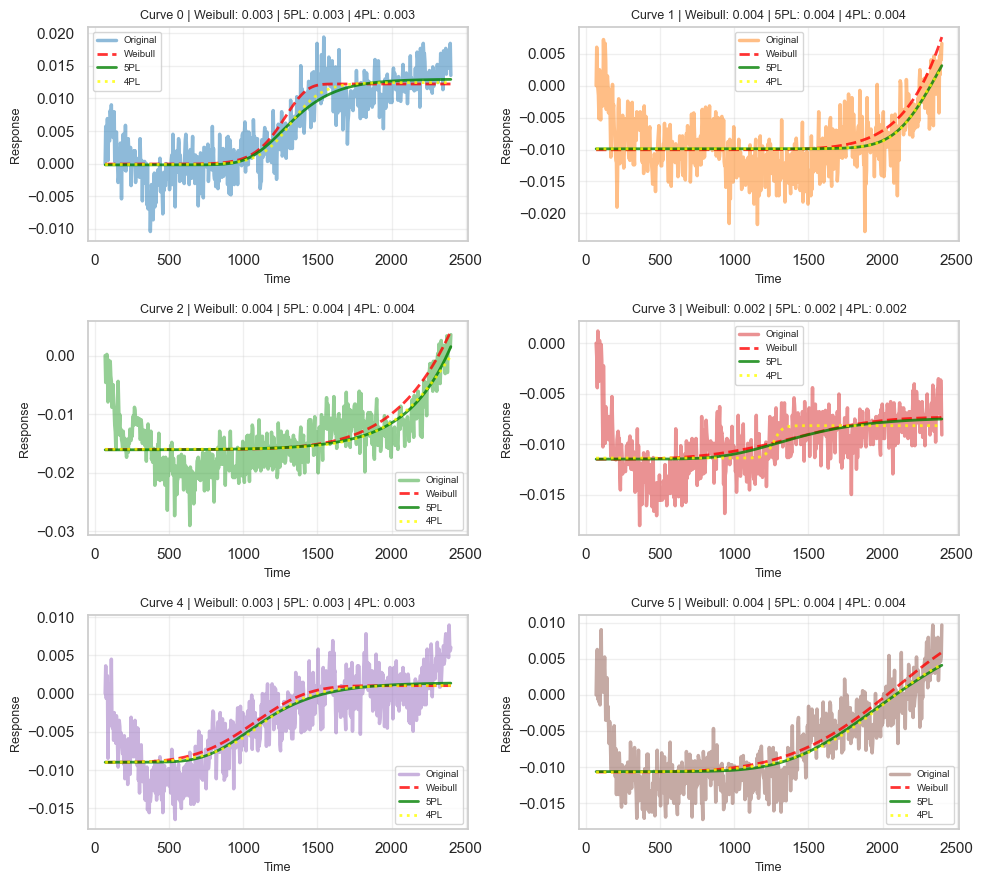

In [11]:
plt_rows = 3
plt_cols = 2
fig_width = plt_cols * 5
fig_height = plt_rows * 3

fig, axes = plt.subplots(plt_rows, plt_cols, figsize=(fig_width, fig_height))
axes = axes.flatten()

X_2d_bs_active_5p_fitted = results["5p"]["fitted"]
X_2d_bs_active_4p_fitted = results["4p"]["fitted"]
X_2d_bs_active_weibull_fitted = results["weibull"]["fitted"]


for idx in range(plt_rows*plt_cols):
    ax = axes[idx]
    
    color = plt.cm.tab10(idx)
    
    # Check for NaN values in weibull
    if np.any(np.isnan(X_2d_bs_active_weibull_fitted[idx, :])):
        ax.text(0.5, 0.5, 'NaN Data', ha='center', va='center', 
                transform=ax.transAxes, fontsize=12, color='red')
        ax.set_title(f'Curve {idx} - FAILED', fontsize=10, color='red')
        continue
    
    # Plot original data (solid)
    ax.plot(X_time, X_2d_bs_active[idx, :], 
            color=color, linestyle='-', linewidth=2.5, 
            alpha=0.5, label='Original')
    
    # Plot weibull fitted (dashed)
    ax.plot(X_time, X_2d_bs_active_weibull_fitted[idx, :], 
            color="red", linestyle='--', linewidth=2, 
            alpha=0.8, label='Weibull')
    
    # Plot 5p fitted (dotted)
    ax.plot(X_time, X_2d_bs_active_5p_fitted[idx, :], 
            color="green", linestyle='-', linewidth=2, 
            alpha=0.8, label='5PL')
        
    # Plot 4p fitted (dotted)
    ax.plot(X_time, X_2d_bs_active_4p_fitted[idx, :], 
            color="yellow", linestyle=':', linewidth=2, 
            alpha=0.8, label='4PL')


    # Calculate RMSE for both models
    rmse_weibull = np.sqrt(np.nanmean((X_2d_bs_active_weibull_fitted[idx, :] - X_2d_bs_active[idx, :])**2))
    rmse_5p = np.sqrt(np.nanmean((X_2d_bs_active_5p_fitted[idx, :] - X_2d_bs_active[idx, :])**2))
    rmse_4p = np.sqrt(np.nanmean((X_2d_bs_active_4p_fitted[idx, :] - X_2d_bs_active[idx, :])**2))
    
    ax.set_title(f'Curve {idx} | Weibull: {rmse_weibull:.3f} | 5PL: {rmse_5p:.3f} | 4PL: {rmse_4p:.3f}', fontsize=9)
    ax.set_xlabel('Time', fontsize=9)
    ax.set_ylabel('Response', fontsize=9)
    ax.legend(loc='best', fontsize=7)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [12]:
from scipy.ndimage import convolve1d

def moving_average(X, window_size=5):
    
    mask = np.ones(window_size) / window_size
    X_avg = convolve1d(X, mask, mode='nearest')

    return X_avg

X_2d_bs_active_moving_avg = []

for i in range(X_2d_bs_active.shape[0]):
    avged = moving_average(X_2d_bs_active[i], 50)
    X_2d_bs_active_moving_avg.append(avged)

X_2d_bs_active_moving_avg = np.array(X_2d_bs_active_moving_avg)

In [ ]:
plt_rows = 2
plt_cols = 2
fig_width = plt_cols * 4
fig_height = plt_rows * 3

fig, axes = plt.subplots(plt_rows, plt_cols, figsize=(fig_width, fig_height))
axes = axes.flatten()


for idx in range(plt_rows*plt_cols):
    ax = axes[idx]
    
    color = plt.cm.tab10(idx)
    
    # Check for NaN values in weibull
    if np.any(np.isnan(X_2d_bs_active_weibull_fitted[idx, :])):
        ax.text(0.5, 0.5, 'NaN Data', ha='center', va='center', 
                transform=ax.transAxes, fontsize=12, color='red')
        ax.set_title(f'Curve {idx} - FAILED', fontsize=10, color='red')
        continue
    
    # Plot original data (solid)
    ax.plot(X_time, X_2d_bs_active[idx, :], 
            color=color, linestyle='-', linewidth=2.5, 
            alpha=0.5, label='Original')
    

    ax.plot(X_time, X_2d_bs_active_moving_avg[idx, :], 
            color="red", linestyle='-', linewidth=2, 
            alpha=0.8, label='MovingAvg')
    
    ax.plot(X_time, X_2d_bs_active_5p_fitted[idx, :], 
            color="green", linestyle='-', linewidth=2, 
            alpha=0.8, label='5PL')

    # Calculate RMSE for both models
    rmse_5p = np.sqrt(np.nanmean((X_2d_bs_active_5p_fitted[idx, :] - X_2d_bs_active[idx, :])**2))
    rmse_ma = np.sqrt(np.nanmean((X_2d_bs_active_moving_avg[idx, :] - X_2d_bs_active[idx, :])**2))
    
    ax.set_title(f'Curve {idx} | Moving Average: {rmse_ma:.3f} | 5PL: {rmse_5p:.3f}', fontsize=9)
    ax.set_xlabel('Time', fontsize=9)
    ax.set_ylabel('Response', fontsize=9)
    ax.legend(loc='best', fontsize=7)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined

/var/folders/xt/t6fw9lz91vg0ryq45tpjcjpc0000gn/T/ipykernel_38626/2168245581.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_s.legend(loc='best', fontsize=7)
/var/folders/xt/t6fw9lz91vg0ryq45tpjcjpc0000gn/T/ipykernel_38626/2168245581.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_1st.legend(loc='best', fontsize=7)
/var/folders/xt/t6fw9lz91vg0ryq45tpjcjpc0000gn/T/ipykernel_38626/2168245581.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_2nd.legend(loc='best', fontsize=7)


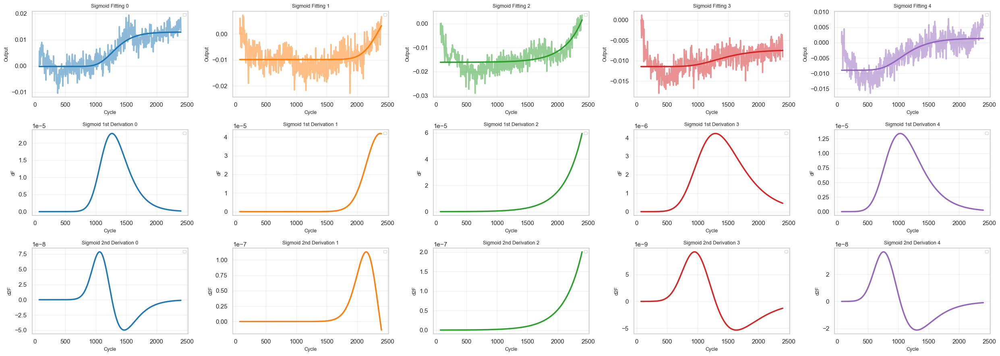

In [14]:
plt_rows = 3
plt_cols = 5
fig_width = plt_cols * 5
fig_height = plt_rows * 3

fig, axes = plt.subplots(plt_rows, plt_cols, figsize=(fig_width, fig_height))
axes = axes.flatten()

X_2d_bs_active_5p_fitted = results["5p"]["fitted"]
X_2d_bs_active_5p_1stder = results["5p"]["1st_d"]
X_2d_bs_active_5p_2ndder = results["5p"]["2nd_d"]

for idx in range(plt_cols):
        ax_s = axes[idx]
        ax_1st = axes[idx+plt_cols]
        ax_2nd = axes[idx+2*plt_cols]

        color = plt.cm.tab10(idx)

        ax_s.plot(X_time, X_2d_bs_active[idx, :], 
                color=color, linestyle='-', linewidth=2.5, alpha=0.5)

        ax_s.plot(X_time, X_2d_bs_active_5p_fitted[idx, :], 
                color=color, linestyle='-', linewidth=2.5)
        ax_s.set_title(f'Sigmoid Fitting {idx}', fontsize=9)
        ax_s.set_xlabel('Cycle', fontsize=9)
        ax_s.set_ylabel('Output', fontsize=9)
        ax_s.legend(loc='best', fontsize=7)
        ax_s.grid(True, alpha=0.3)

        ax_1st.plot(X_time, X_2d_bs_active_5p_1stder[idx, :], 
                color=color, linestyle='-', linewidth=2.5)
        ax_1st.set_title(f'Sigmoid 1st Derivation {idx}', fontsize=9)
        ax_1st.set_xlabel('Cycle', fontsize=9)
        ax_1st.set_ylabel('dF', fontsize=9)
        ax_1st.legend(loc='best', fontsize=7)
        ax_1st.grid(True, alpha=0.3)

        ax_2nd.plot(X_time, X_2d_bs_active_5p_2ndder[idx, :], 
                color=color, linestyle='-', linewidth=2.5)
        ax_2nd.set_title(f'Sigmoid 2nd Derivation {idx}', fontsize=9)
        ax_2nd.set_xlabel('Cycle', fontsize=9)
        ax_2nd.set_ylabel('d2F', fontsize=9)
        ax_2nd.legend(loc='best', fontsize=7)
        ax_2nd.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [15]:
from sklearn.manifold import TSNE

movavg_tsne = TSNE(n_components=2, init='random', learning_rate='auto', 
                   random_state=42).fit_transform(X_2d_bs_active_moving_avg)

sig5p_tsne = TSNE(n_components=2, init='random', learning_rate='auto', 
                   random_state=42).fit_transform(X_2d_bs_active_5p_fitted)

original_tsne = TSNE(n_components=2, init='random', learning_rate='auto', 
                   random_state=42).fit_transform(X_2d_bs_active)

In [111]:
movavg_tsne.shape

(12047, 2)

Total samples: 12047
Expected: 12047


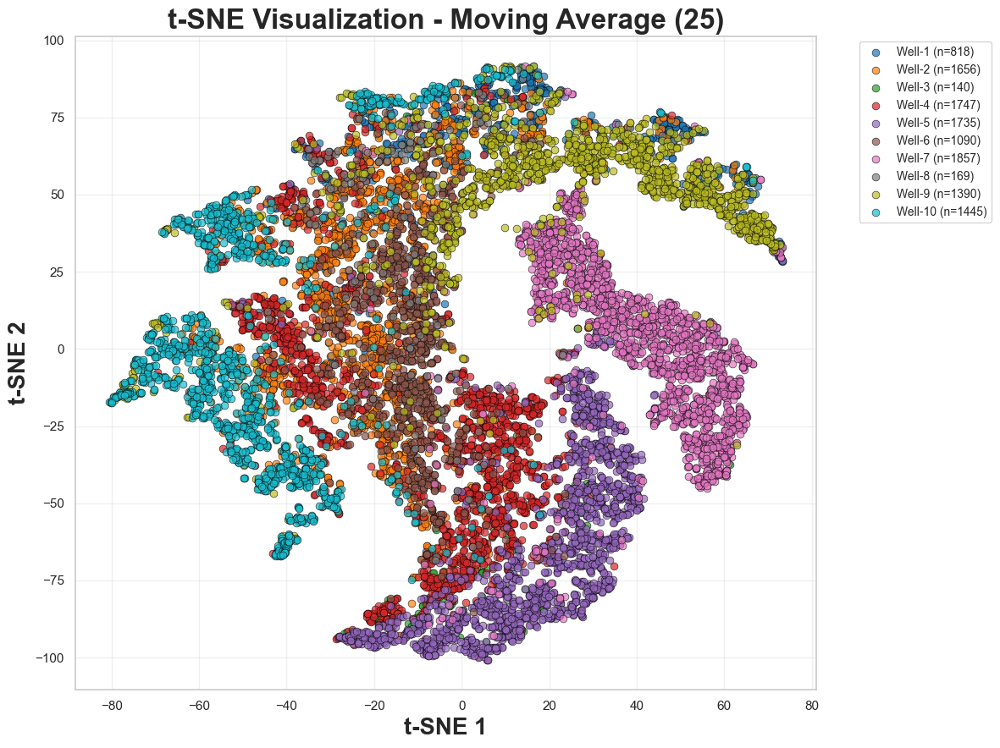

In [16]:

print(f"Total samples: {len(Y_well)}")
print(f"Expected: {X_2d_bs_active_moving_avg.shape[0]}")

# Create scatter plot with color by label
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = Y_well == label
    ax.scatter(movavg_tsne[mask, 0], movavg_tsne[mask, 1],
              alpha=0.7, s=40, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('t-SNE 1', fontsize=20, fontweight='bold')
ax.set_ylabel('t-SNE 2', fontsize=20, fontweight='bold')
ax.set_title('t-SNE Visualization - Moving Average (25)', fontsize=24, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


Total samples: 12047
Expected: 12047


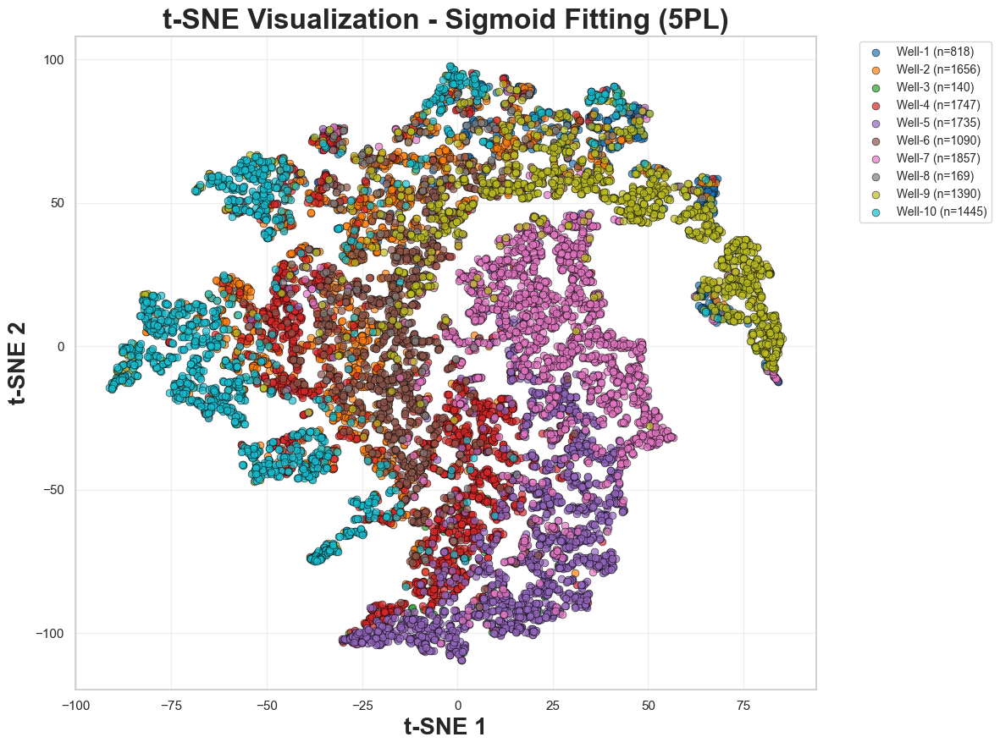

In [17]:
print(f"Total samples: {len(Y_well)}")
print(f"Expected: {X_2d_bs_active_5p_fitted.shape[0]}")

# Create scatter plot with color by label
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = Y_well == label
    ax.scatter(sig5p_tsne[mask, 0], sig5p_tsne[mask, 1],
              alpha=0.7, s=40, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('t-SNE 1', fontsize=20, fontweight='bold')
ax.set_ylabel('t-SNE 2', fontsize=20, fontweight='bold')
ax.set_title('t-SNE Visualization - Sigmoid Fitting (5PL)', fontsize=24, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


Total samples: 12047
Expected: 12047


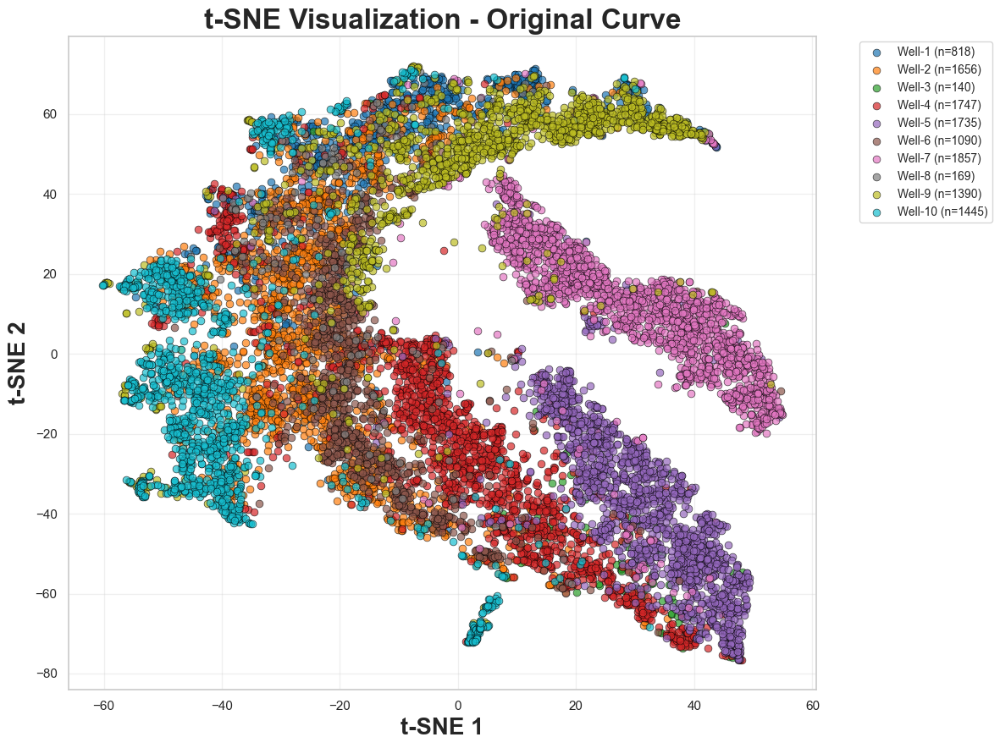

In [18]:
print(f"Total samples: {len(Y_well)}")
print(f"Expected: {X_2d_bs_active.shape[0]}")

# Create scatter plot with color by label
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = Y_well == label
    ax.scatter(original_tsne[mask, 0], original_tsne[mask, 1],
              alpha=0.7, s=40, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('t-SNE 1', fontsize=20, fontweight='bold')
ax.set_ylabel('t-SNE 2', fontsize=20, fontweight='bold')
ax.set_title('t-SNE Visualization - Original Curve', fontsize=24, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


In [19]:
from sklearn import decomposition

pca = decomposition.PCA(n_components=0.95, whiten=False)
movavg_pca = pca.fit_transform(X_2d_bs_active_moving_avg)
sig5p_pca = pca.fit_transform(X_2d_bs_active_5p_fitted)
print(movavg_pca.shape)
print(sig5p_pca.shape)

(12047, 3)
(12047, 2)


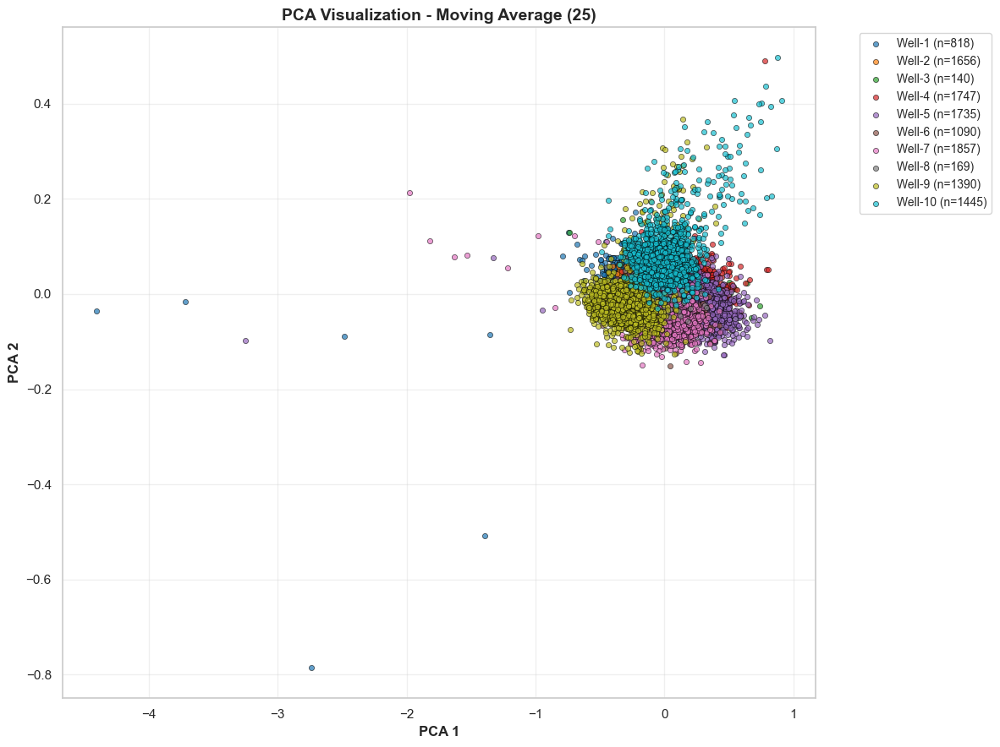

In [20]:
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = Y_well == label
    ax.scatter(movavg_pca[mask, 0], movavg_pca[mask, 1],
              alpha=0.7, s=20, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('PCA 1', fontsize=12, fontweight='bold')
ax.set_ylabel('PCA 2', fontsize=12, fontweight='bold')
ax.set_title('PCA Visualization - Moving Average (25)', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


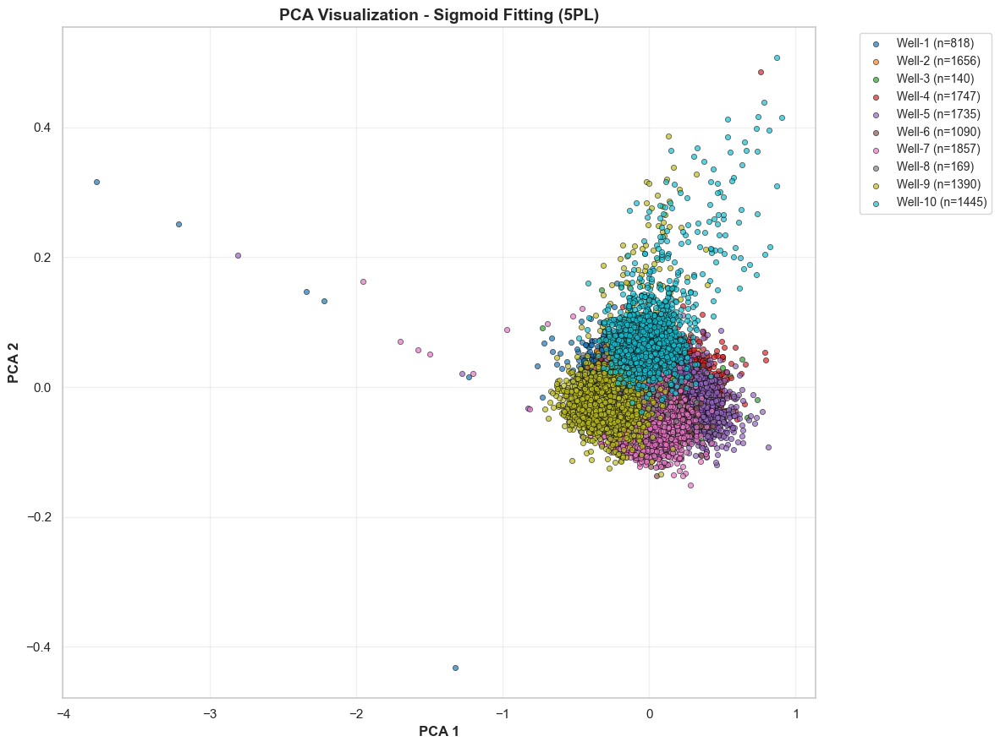

In [21]:
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = Y_well == label
    ax.scatter(sig5p_pca[mask, 0], sig5p_pca[mask, 1],
              alpha=0.7, s=20, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('PCA 1', fontsize=12, fontweight='bold')
ax.set_ylabel('PCA 2', fontsize=12, fontweight='bold')
ax.set_title('PCA Visualization - Sigmoid Fitting (5PL)', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


In [22]:
KINETIC_PARAMS

['xms',
 'xs',
 'xe',
 'xp1',
 'xp2',
 'TH',
 'y_xms',
 'y_xs',
 'y_xe',
 'y_xp1',
 'y_xp2',
 'dy_xms',
 'dy_xp1',
 'dy_xp2',
 'd2y_xp1',
 'd2y_xp2',
 'threshold_distance',
 'first_half_distance',
 'second_half_distance',
 'distance_asymmetry_index',
 'peak_shifting_distance',
 'A1',
 'A2',
 'area_asymmetry_index',
 'peak_asymmetry_index',
 'Ct',
 'Cy0',
 'log_F0']

In [23]:
Y_well

array([0, 0, 0, ..., 9, 9, 9], shape=(12047,))

In [24]:
model_results = results["5p"]
df_dict = {}

arr = np.array(Y_well)
df_dict["well_id"] = arr

params_array = np.array(model_results["params"])  # Shape: (n_curves, 5)

df_dict["Fm"] = params_array[:, 0]
df_dict["Fb"] = params_array[:, 1]
df_dict["Sc"] = params_array[:, 2]
df_dict["Cs"] = params_array[:, 3]
df_dict["As"] = params_array[:, 4]

for key, value in model_results.items():
    if key in KINETIC_PARAMS:
        arr = np.array(value)
    
        if arr.ndim == 1:
            df_dict[key] = arr

kinetic_df = pd.DataFrame(df_dict)

In [25]:
def analyze_missing_patterns(df):
    """Analyze missing value patterns"""
    
    missing = df.isnull().sum()
    missing_pct = (missing / len(df)) * 100
    
    print("Missing Value Analysis")
    print("=" * 70)
    for col in df.columns:
        print(f"{col:<35} {missing[col]:>6} ({missing_pct[col]:>5.2f}%)")
    print("=" * 70)
    
    return missing, missing_pct


analyze_missing_patterns(kinetic_df)

Missing Value Analysis
well_id                                  0 ( 0.00%)
Fm                                       0 ( 0.00%)
Fb                                       0 ( 0.00%)
Sc                                       0 ( 0.00%)
Cs                                       0 ( 0.00%)
As                                       0 ( 0.00%)
xms                                      0 ( 0.00%)
xs                                      18 ( 0.15%)
xe                                      18 ( 0.15%)
xp1                                   1262 (10.48%)
xp2                                   2191 (18.19%)
TH                                       0 ( 0.00%)
y_xms                                    0 ( 0.00%)
y_xs                                    18 ( 0.15%)
y_xe                                    18 ( 0.15%)
y_xp1                                 1262 (10.48%)
y_xp2                                 2191 (18.19%)
dy_xms                                   0 ( 0.00%)
dy_xp1                                126

(well_id                         0
 Fm                              0
 Fb                              0
 Sc                              0
 Cs                              0
 As                              0
 xms                             0
 xs                             18
 xe                             18
 xp1                          1262
 xp2                          2191
 TH                              0
 y_xms                           0
 y_xs                           18
 y_xe                           18
 y_xp1                        1262
 y_xp2                        2191
 dy_xms                          0
 dy_xp1                       1262
 dy_xp2                       2191
 d2y_xp1                      1262
 d2y_xp2                      2191
 threshold_distance             18
 first_half_distance            18
 second_half_distance           18
 distance_asymmetry_index      254
 peak_shifting_distance       3020
 A1                             18
 A2                 

In [26]:
kinetic_df.shape[0]

12047

In [27]:
kinetic_df.shape[0] - kinetic_df.dropna().shape[0]

10468

In [28]:
3030/12047

0.2515148999750975

In [29]:
kinetic_df.corr().sort_values("well_id", ascending=False)

,well_id,Fm,Fb,Sc,Cs,As,xms,xs,xe,xp1,...,second_half_distance,distance_asymmetry_index,peak_shifting_distance,A1,A2,area_asymmetry_index,peak_asymmetry_index,Ct,Cy0,log_F0
well_id,1.000000,0.100232,-0.103632,0.102611,0.109849,-0.110737,0.029901,0.128738,-0.089123,0.128362,...,-0.073713,0.020402,-0.217820,0.089477,-0.034021,0.017442,-0.069716,0.068488,-0.212103,0.008539
dy_xms,0.161985,0.304135,0.080038,0.564826,0.127418,-0.084200,-0.004002,0.129535,-0.323197,0.037941,...,-0.144685,-0.009156,-0.323942,0.412944,0.141784,-0.015933,-0.053989,0.056516,-0.429793,0.000527
TH,0.161985,0.304135,0.080038,0.564826,0.127418,-0.084200,-0.004002,0.129535,-0.323197,0.037941,...,-0.144685,-0.009156,-0.323942,0.412944,0.141784,-0.015933,-0.053989,0.056516,-0.429793,0.000527
dy_xp1,0.151965,0.350886,-0.027614,0.442263,0.239280,-0.274329,-0.004570,0.068848,-0.321991,0.110126,...,-0.178981,0.004396,-0.298299,0.478082,0.168024,-0.110774,-0.246365,0.018347,-0.485590,-0.003638
xs,0.128738,-0.306639,0.150555,0.238616,0.306304,0.223513,0.544528,1.000000,0.112840,0.689022,...,-0.532494,-0.062796,-0.436311,-0.178013,-0.425777,-0.054763,0.203832,0.875316,-0.216764,0.029971
xp1,0.128362,-0.005762,0.088112,0.168537,0.704314,-0.266158,0.912625,0.689022,0.302799,1.000000,...,-0.870262,-0.743437,-0.385651,0.157488,-0.644536,-0.655917,-0.220249,0.855538,-0.338875,-0.044377
Cs,0.109849,0.095671,0.013340,0.205089,1.000000,-0.635331,0.687029,0.306304,0.052983,0.704314,...,-0.717863,-0.125193,-0.388580,0.394838,-0.610208,-0.133165,-0.754615,0.441287,-0.344459,-0.049754
Sc,0.102611,-0.130704,0.001459,1.000000,0.205089,-0.132743,0.078101,0.238616,-0.278857,0.168537,...,-0.221464,-0.015831,-0.358064,-0.042520,-0.191208,-0.018011,-0.188125,0.129480,-0.181102,-0.023407
Fm,0.100232,1.000000,-0.329696,-0.130704,0.095671,-0.390220,0.050697,-0.306639,0.196993,-0.005762,...,0.033494,0.061609,0.486918,0.747934,0.304202,0.056864,-0.320433,-0.191866,-0.334379,-0.024323
dy_xp2,0.093027,0.152029,0.068819,0.479980,0.039951,0.018980,-0.069920,0.096438,-0.371673,-0.021418,...,-0.129439,-0.006093,-0.274814,0.247060,0.224834,-0.011971,0.026954,0.003750,-0.226274,0.002274


In [30]:
kinetic_df_nona = kinetic_df.copy()
kinetic_df_nona = kinetic_df_nona.dropna()
kinetic_tsne = TSNE(n_components=2, init='random', learning_rate='auto', 
                   random_state=42).fit_transform(kinetic_df_nona.loc[:, kinetic_df_nona.columns != 'well_id'])

In [31]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance

scaler = StandardScaler()

X = kinetic_df_nona.loc[:, kinetic_df_nona.columns != 'well_id']
X_scaled = scaler.fit_transform(X)
y = kinetic_df_nona['well_id']
feature_cols = kinetic_df_nona.columns[kinetic_df_nona.columns != 'well_id']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
# rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_scaled, y)

kinetic_importances_rf = pd.DataFrame({'feature': feature_cols, 'importance': rf.feature_importances_})
print("\n--- Feature Importance ---")
print(kinetic_importances_rf.sort_values(by='importance', ascending=False))


--- Feature Importance ---
                     feature  importance
30                        Ct    0.084444
0                         Fm    0.064140
9                        xp2    0.060219
5                        xms    0.055934
13                      y_xe    0.051823
26                        A1    0.047593
18                    dy_xp2    0.044813
16                    dy_xms    0.044269
8                        xp1    0.039673
27                        A2    0.038843
23      second_half_distance    0.035700
10                        TH    0.035365
15                     y_xp2    0.032520
6                         xs    0.028557
17                    dy_xp1    0.025687
21        threshold_distance    0.022392
24  distance_asymmetry_index    0.021075
1                         Fb    0.019937
22       first_half_distance    0.019855
2                         Sc    0.018575
20                   d2y_xp2    0.018118
29      peak_asymmetry_index    0.018066
3                         Cs 

In [32]:
perm_importance = permutation_importance(rf, X_scaled, y, n_repeats=10,random_state=42,n_jobs=-1)
    
kinetic_importances_perm = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': perm_importance.importances_mean,
    'Std': perm_importance.importances_std
}).sort_values('Importance', ascending=False)

print(kinetic_importances_perm)

                     Feature  Importance       Std
30                        Ct    0.017416  0.002305
0                         Fm    0.008423  0.001747
9                        xp2    0.005003  0.000999
26                        A1    0.003230  0.000916
23      second_half_distance    0.002787  0.000989
5                        xms    0.002723  0.001023
29      peak_asymmetry_index    0.002597  0.000597
16                    dy_xms    0.002343  0.000495
6                         xs    0.001837  0.000916
13                      y_xe    0.001457  0.000852
8                        xp1    0.001457  0.000406
27                        A2    0.001140  0.000621
12                      y_xs    0.001013  0.000310
18                    dy_xp2    0.000760  0.000552
10                        TH    0.000760  0.000474
1                         Fb    0.000697  0.000190
15                     y_xp2    0.000633  0.000491
2                         Sc    0.000570  0.000190
4                         As   

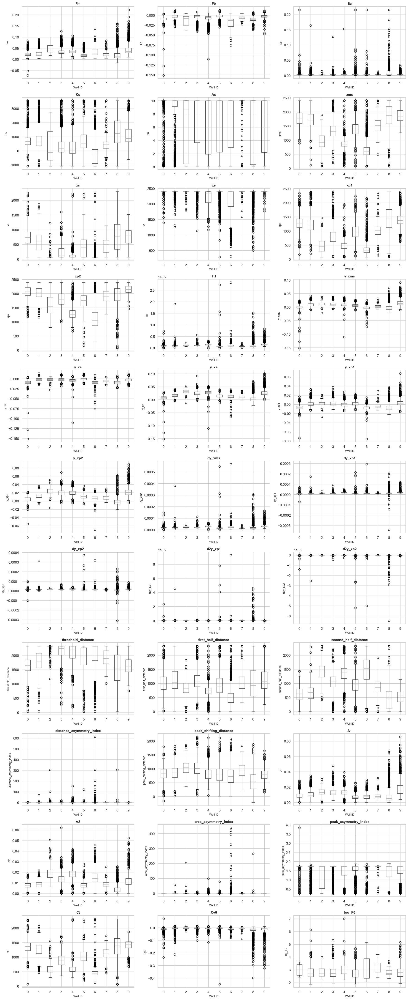

In [33]:
numeric_cols = kinetic_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [c for c in numeric_cols if c != 'well_id']

n_cols = len(numeric_cols)
rows = (n_cols + 2) // 3

fig, axes = plt.subplots(rows, 3, figsize=(18, rows*4))
axes = axes.flatten()

for idx, (ax, col) in enumerate(zip(axes, numeric_cols)):
    # Independent y-axis for each column
    kinetic_df.boxplot(column=col, by='well_id', ax=ax)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_xlabel('Well ID', fontsize=9)
    ax.set_ylabel(col, fontsize=9)
    ax.get_figure().suptitle('')

for ax in axes[n_cols:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


In [34]:
pca = decomposition.PCA(n_components=0.975, whiten=False)
kinetic_pca = pca.fit_transform(kinetic_df_nona.loc[:, kinetic_df_nona.columns != 'well_id'])
print(kinetic_pca.shape)

(1579, 5)


(<Figure size 1200x900 with 1 Axes>,
 <Axes3D: title={'center': 'xms vs dy_xp2 vs Fm'}, xlabel='xms', ylabel='dy_xp2', zlabel='Fm'>)

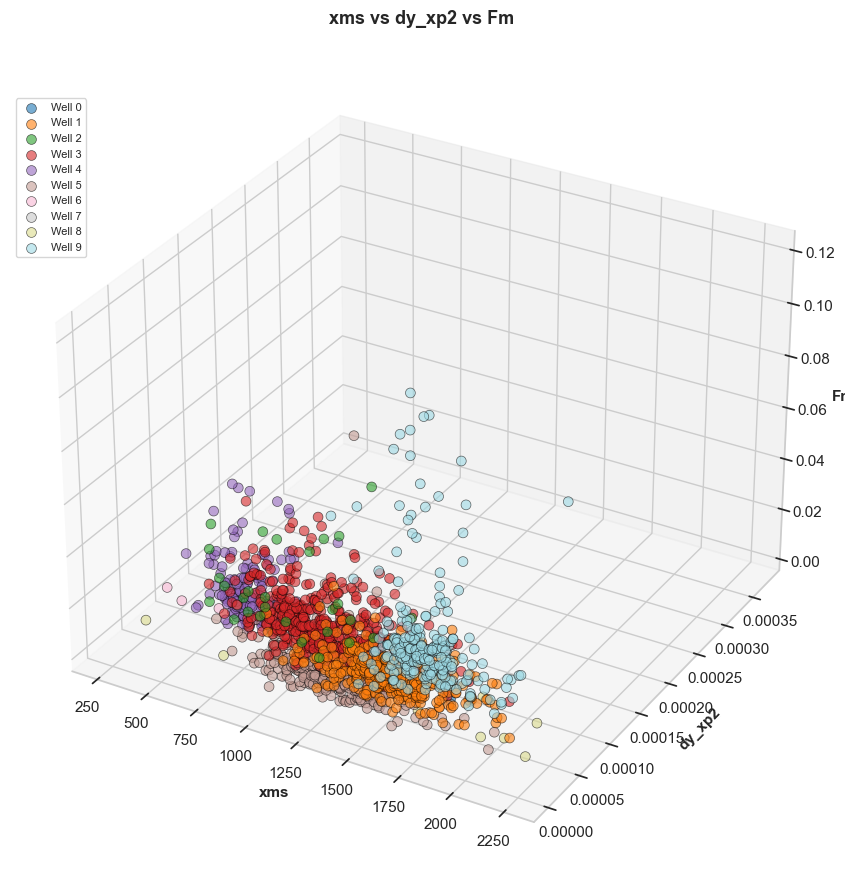

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

def scatter_adaptive(df, x_col, y_col, z_col=None, well_id_col='well_id', 
                    figsize=None, title=None, color_by=None):
    if z_col is None:
        plot_cols = [x_col, y_col, well_id_col]
        if color_by and color_by != well_id_col:
            plot_cols.append(color_by)
    else:
        plot_cols = [x_col, y_col, z_col, well_id_col]
        if color_by and color_by != well_id_col:
            plot_cols.append(color_by)
    
    plot_df = df[plot_cols].dropna()
    
    if figsize is None:
        figsize = (14, 10) if z_col is None else (12, 9)
    
    # ========================================================================
    # 2D CASE
    # ========================================================================
    
    if z_col is None:
        
        fig, ax = plt.subplots(figsize=figsize)
        
        # Get unique wells
        wells = sorted(plot_df[well_id_col].unique())
        n_wells = len(wells)
        
        # Color map
        colors = plt.cm.tab20(np.linspace(0, 1, min(n_wells, 20)))
        if n_wells > 20:
            colors = plt.cm.hsv(np.linspace(0, 1, n_wells))
        
        # Determine what to color by
        if color_by and color_by != well_id_col:
            # Color by continuous variable
            scatter = ax.scatter(plot_df[x_col], plot_df[y_col],
                               s=50, alpha=0.6,
                               c=plot_df[color_by], cmap='viridis',
                               edgecolors='black', linewidth=0.5)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(color_by, fontsize=11, fontweight='bold')
        else:
            # Color by well
            for i, well in enumerate(wells):
                mask = plot_df[well_id_col] == well
                data = plot_df[mask]
                ax.scatter(data[x_col], data[y_col],
                          s=50, alpha=0.6, c=[colors[i]],
                          label=f'Well {well}',
                          edgecolors='black', linewidth=0.5)
            
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', 
                     fontsize=9, ncol=1)
        
        ax.set_xlabel(x_col, fontsize=12, fontweight='bold')
        ax.set_ylabel(y_col, fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Statistics
        stats_text = f"n = {len(plot_df)} points\n" \
                    f"Wells = {n_wells}\n" \
                    f"{x_col}: [{plot_df[x_col].min():.2f}, {plot_df[x_col].max():.2f}]\n" \
                    f"{y_col}: [{plot_df[y_col].min():.2f}, {plot_df[y_col].max():.2f}]"
        
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
               fontsize=9, verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
    
    # ========================================================================
    # 3D CASE
    # ========================================================================
    
    else:
        
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection='3d')
        
        # Get unique wells
        wells = sorted(plot_df[well_id_col].unique())
        n_wells = len(wells)
        
        # Color map
        colors = plt.cm.tab20(np.linspace(0, 1, min(n_wells, 20)))
        if n_wells > 20:
            colors = plt.cm.hsv(np.linspace(0, 1, n_wells))
        
        # Determine what to color by
        if color_by and color_by != well_id_col:
            # Color by continuous variable
            scatter = ax.scatter(plot_df[x_col], plot_df[y_col], plot_df[z_col],
                               s=50, alpha=0.6,
                               c=plot_df[color_by], cmap='viridis',
                               edgecolors='black', linewidth=0.5)
            cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
            cbar.set_label(color_by, fontsize=10, fontweight='bold')
        else:
            # Color by well
            for i, well in enumerate(wells):
                mask = plot_df[well_id_col] == well
                data = plot_df[mask]
                ax.scatter(data[x_col], data[y_col], data[z_col],
                          s=50, alpha=0.6, c=[colors[i]],
                          label=f'Well {well}',
                          edgecolors='black', linewidth=0.5)
            
            ax.legend(bbox_to_anchor=(0.0, 0.95), loc='upper left',
                     fontsize=8, ncol=1)
        
        ax.set_xlabel(x_col, fontsize=11, fontweight='bold')
        ax.set_ylabel(y_col, fontsize=11, fontweight='bold')
        ax.set_zlabel(z_col, fontsize=11, fontweight='bold')
    
    # Set title
    if title is None:
        if z_col is None:
            title = f'{x_col} vs {y_col}'
        else:
            title = f'{x_col} vs {y_col} vs {z_col}'
    
    ax.set_title(title, fontsize=13, fontweight='bold', pad=20)
    
    plt.tight_layout()
    
    return fig, ax


# ============================================================================
# CONVENIENCE FUNCTIONS
# ============================================================================

def scatter_2d(df, x_col, y_col, well_id_col='well_id', **kwargs):
    """2D scatter plot wrapper"""
    return scatter_adaptive(df, x_col, y_col, z_col=None, 
                          well_id_col=well_id_col, **kwargs)


def scatter_3d(df, x_col, y_col, z_col, well_id_col='well_id', **kwargs):
    """3D scatter plot wrapper"""
    return scatter_adaptive(df, x_col, y_col, z_col=z_col,
                          well_id_col=well_id_col, **kwargs)

scatter_adaptive(kinetic_df_nona, "xms", "dy_xp2", "Fm")


Total samples: 12047
Expected: 12047


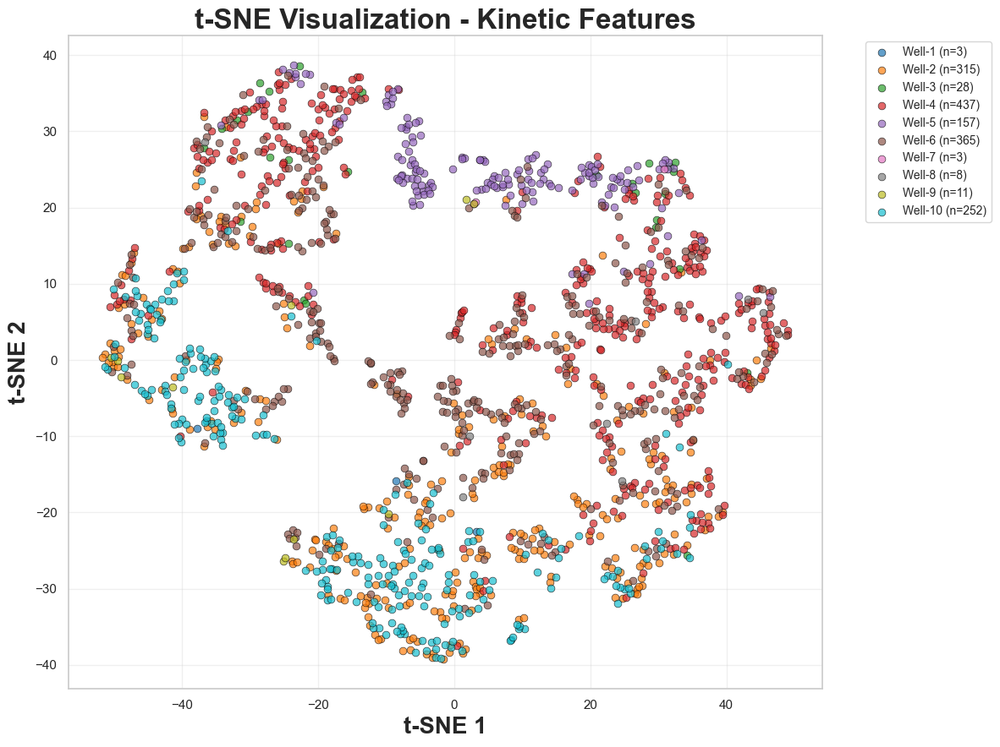

In [36]:
print(f"Total samples: {len(Y_well)}")
print(f"Expected: {X_2d_bs_active.shape[0]}")

# Create scatter plot with color by label
fig, ax = plt.subplots(figsize=(12, 9))

colors = plt.cm.tab10(np.arange(10))
for label in range(n_wells):
    mask = kinetic_df_nona["well_id"] == label
    ax.scatter(kinetic_tsne[mask, 0], kinetic_tsne[mask, 1],
              alpha=0.7, s=40, c=[colors[label]], 
              label=f'Well-{label+1} (n={np.sum(mask)})',
              edgecolors='black', linewidth=0.5)

ax.set_xlabel('t-SNE 1', fontsize=20, fontweight='bold')
ax.set_ylabel('t-SNE 2', fontsize=20, fontweight='bold')
ax.set_title('t-SNE Visualization - Kinetic Features', fontsize=24, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


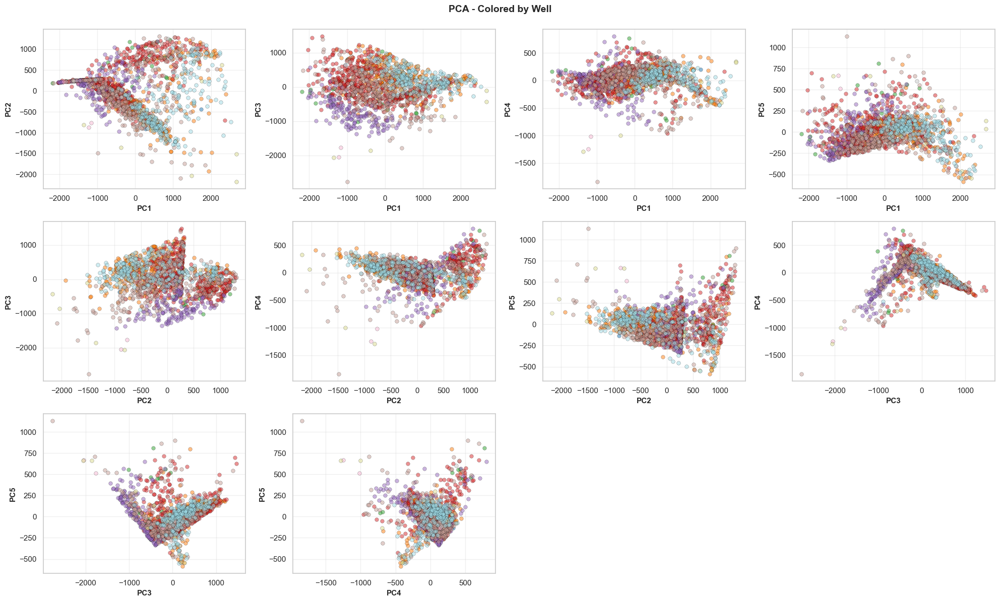

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

def plot_all_pca_combinations(pca_data, well_ids=None, figsize=None, title="PCA Analysis"):
    """
    Plot all pairwise combinations of PCA components
    
    Parameters
    ----------
    pca_data : ndarray
        PCA transformed data (n_samples, n_components)
    well_ids : array, optional
        Well labels for coloring
    figsize : tuple, optional
        Figure size
    title : str
        Plot title
    """
    
    n_components = pca_data.shape[1]
    n_combinations = len(list(combinations(range(n_components), 2)))
    
    # Determine grid size
    if n_combinations <= 6:
        rows, cols = 2, 3
    elif n_combinations <= 12:
        rows, cols = 3, 4
    else:
        cols = 4
        rows = (n_combinations + cols - 1) // cols
    
    if figsize is None:
        figsize = (cols * 5, rows * 4)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    
    # Get all combinations
    combinations_list = list(combinations(range(n_components), 2))
    
    # Set up colors
    if well_ids is not None:
        unique_wells = np.unique(well_ids)
        colors = plt.cm.tab20(np.linspace(0, 1, len(unique_wells)))
        color_map = {well: colors[i] for i, well in enumerate(unique_wells)}
    
    # Plot each combination
    for idx, (ax, (pc1, pc2)) in enumerate(zip(axes, combinations_list)):
        
        if well_ids is not None:
            # Color by well
            for well in np.unique(well_ids):
                mask = well_ids == well
                ax.scatter(pca_data[mask, pc1], pca_data[mask, pc2],
                          alpha=0.5, s=30, label=f'Well {well}',
                          c=[color_map[well]], edgecolors='black', linewidth=0.3)
        else:
            # Single color
            ax.scatter(pca_data[:, pc1], pca_data[:, pc2],
                      alpha=0.6, s=30, edgecolors='black', linewidth=0.3)
        
        ax.set_xlabel(f'PC{pc1+1}', fontsize=11, fontweight='bold')
        ax.set_ylabel(f'PC{pc2+1}', fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for ax in axes[len(combinations_list):]:
        ax.set_visible(False)
    
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    return fig, axes

well_ids = kinetic_df_nona['well_id'].values

fig, axes = plot_all_pca_combinations(kinetic_pca, 
                                     well_ids=well_ids,
                                     title="PCA - Colored by Well")
plt.show()

In [38]:
kinetic_df.head()

,well_id,Fm,Fb,Sc,Cs,As,xms,xs,xe,xp1,...,second_half_distance,distance_asymmetry_index,peak_shifting_distance,A1,A2,area_asymmetry_index,peak_asymmetry_index,Ct,Cy0,log_F0
0,0,0.013169,-0.000206,0.005174,958.562152,4.919963,1267.1,832.933496,2053.232045,1065.5,...,786.132045,1.810669,401.9,0.005243,0.007634,1.456199,1.578467,1141.650383,-0.005078,NaN
1,0,0.027990,-0.009888,0.004926,2207.795507,2.319798,2379.6,1805.331978,2398.500000,2148.6,...,18.900000,0.032911,NaN,0.012020,0.000792,0.065878,NaN,2090.322214,-0.074999,NaN
2,0,0.065131,-0.016128,0.025731,2785.713762,0.131010,2398.5,1509.794762,2398.500000,NaN,...,0.000000,0.000000,NaN,0.016777,0.000000,0.000000,NaN,1921.520393,-0.235912,NaN
3,0,0.004122,-0.011455,0.002929,507.617572,10.000000,1293.6,614.826230,2398.500000,951.8,...,1104.900000,1.627788,685.9,0.001571,0.002375,1.511903,1.729908,1094.602583,-0.011481,NaN
4,0,0.010402,-0.008971,0.003675,406.988951,10.000000,1035.1,492.410103,2128.662577,758.8,...,1093.562577,2.015078,549.9,0.003987,0.006187,1.551686,1.729945,880.648865,-0.009037,NaN


# 4. Model Test

## 4.1. KNN

In [39]:
from sklearn.model_selection import cross_val_score, KFold, StratifiedKFold, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

def knn_cv_classification(X, y, k_range=range(1, 31), cv=5, verbose=True):
    """
    Perform k-fold cross-validation for KNN classification
    
    Parameters
    ----------
    X : array-like, shape (n_samples, n_features)
        Feature matrix
    y : array-like, shape (n_samples,)
        Target variable (CLASSIFICATION - discrete classes)
    k_range : range or list
        Range of k values to test
    cv : int
        Number of cross-validation folds
    verbose : bool
        Print progress
    
    Returns
    -------
    results_df : pd.DataFrame
        Cross-validation results for each k
    best_k : int
        Optimal k value
    scaler : StandardScaler
        Fitted scaler
    """
    
    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    results = []
    skfold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)
    
    if verbose:
        print(f"KNN Cross-Validation (CLASSIFICATION)")
        print(f"Features: {X.shape[1]}, Samples: {X.shape[0]}, CV folds: {cv}")
        print(f"Classes: {len(np.unique(y))}")
        print("=" * 80)
    
    for k in k_range:
        
        if verbose:
            print(f"k={k:2d} ", end="", flush=True)
        
        model = KNeighborsClassifier(n_neighbors=k)
        
        # ====================================================================
        # CLASSIFICATION SCORING ONLY
        # ====================================================================
        
        scoring_dict = {
            'accuracy': 'accuracy',
        }
        
        cv_scores = cross_validate(model, X_scaled, y, cv=skfold,
                                  scoring=scoring_dict, return_train_score=True)
        
        accuracy_scores = cv_scores['test_accuracy']
        
        result_dict = {
            'k': k,
            'accuracy_mean': accuracy_scores.mean(),
            'accuracy_std': accuracy_scores.std(),
            'train_accuracy_mean': cv_scores['train_accuracy'].mean(),
        }
        
        # Add fold-by-fold scores
        for fold_idx in range(cv):
            result_dict[f'accuracy_fold_{fold_idx+1}'] = accuracy_scores[fold_idx] if fold_idx < len(accuracy_scores) else np.nan
        
        results.append(result_dict)
        
        if verbose:
            print(f"Accuracy={accuracy_scores.mean():.4f}±{accuracy_scores.std():.4f}")
    
    results_df = pd.DataFrame(results)
    
    # Find best k
    best_idx = results_df['accuracy_mean'].idxmax()
    best_k = int(results_df.loc[best_idx, 'k'])
    best_acc = results_df.loc[best_idx, 'accuracy_mean']
    
    if verbose:
        print("=" * 80)
        print(f"✓ Best k: {best_k} (Accuracy = {best_acc:.4f})")
    
    return results_df, best_k, scaler


# ============================================================================
# VISUALIZATION
# ============================================================================

def plot_knn_cv_results_regression(results_df, figsize=(15, 10)):
    """
    Plot KNN cross-validation results for REGRESSION
    """
    
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    # ========================================================================
    # 1. R² vs K
    # ========================================================================
    
    ax = axes[0, 0]
    
    ax.errorbar(results_df['k'], results_df['r2_mean'], 
               yerr=results_df['r2_std'],
               marker='o', linewidth=2, markersize=6,
               capsize=5, capthick=2, label='CV Mean ± Std',
               color='steelblue')
    
    # Mark best k
    best_k = results_df[results_df['r2_mean'] == results_df['r2_mean'].max()]['k'].values[0]
    best_score = results_df['r2_mean'].max()
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, label=f'Best k={int(best_k)}')
    ax.plot(best_k, best_score, 'r*', markersize=15)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('R² Score', fontsize=11, fontweight='bold')
    ax.set_title('R² Score vs k', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    
    # ========================================================================
    # 2. RMSE vs K
    # ========================================================================
    
    ax = axes[0, 1]
    
    ax.errorbar(results_df['k'], results_df['rmse_mean'], 
               yerr=results_df['rmse_std'],
               marker='s', linewidth=2, markersize=6,
               capsize=5, capthick=2, label='CV Mean ± Std',
               color='darkorange')
    
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, alpha=0.5)
    ax.plot(best_k, results_df[results_df['k']==best_k]['rmse_mean'].values[0], 
           'r*', markersize=15)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('RMSE', fontsize=11, fontweight='bold')
    ax.set_title('RMSE vs k', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    
    # ========================================================================
    # 3. TRAIN vs TEST (Overfitting Check)
    # ========================================================================
    
    ax = axes[1, 0]
    
    ax.plot(results_df['k'], results_df['train_r2_mean'], 
           'o-', linewidth=2, markersize=6, label='Train R²', color='green', alpha=0.7)
    ax.plot(results_df['k'], results_df['r2_mean'], 
           'o-', linewidth=2, markersize=6, label='Test R² (CV)', color='blue', alpha=0.7)
    
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, alpha=0.5)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('R² Score', fontsize=11, fontweight='bold')
    ax.set_title('Train vs Test R² (Overfitting Check)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    
    # ========================================================================
    # 4. SUMMARY TABLE
    # ========================================================================
    
    ax = axes[1, 1]
    ax.axis('off')
    
    best_row = results_df[results_df['k'] == best_k].iloc[0]
    
    table_data = [
        ['Metric', 'Mean', 'Std'],
        ['R² Score', f"{best_row['r2_mean']:.4f}", f"{best_row['r2_std']:.4f}"],
        ['RMSE', f"{best_row['rmse_mean']:.4f}", f"{best_row['rmse_std']:.4f}"],
        ['MAE', f"{best_row['mae_mean']:.4f}", f"{best_row['mae_std']:.4f}"],
        ['Train R²', f"{best_row['train_r2_mean']:.4f}", '-'],
    ]
    
    table = ax.table(cellText=table_data, cellLoc='center', loc='center',
                    colWidths=[0.3, 0.35, 0.35])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2.5)
    
    # Style header
    for i in range(3):
        table[(0, i)].set_facecolor('#40466e')
        table[(0, i)].set_text_props(weight='bold', color='white')
    
    ax.text(0.5, 0.95, f'Best k = {int(best_k)}', 
           ha='center', va='top', fontsize=14, fontweight='bold',
           transform=ax.transAxes)
    
    fig.suptitle('KNN Cross-Validation Results (Regression)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    return fig


def plot_knn_cv_results_classification(results_df, figsize=(15, 10)):
    """
    Plot KNN cross-validation results for CLASSIFICATION
    """
    
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    # ========================================================================
    # 1. ACCURACY vs K
    # ========================================================================
    
    ax = axes[0, 0]
    
    ax.errorbar(results_df['k'], results_df['accuracy_mean'], 
               yerr=results_df['accuracy_std'],
               marker='o', linewidth=2, markersize=6,
               capsize=5, capthick=2, label='CV Mean ± Std',
               color='steelblue')
    
    best_k = results_df[results_df['accuracy_mean'] == results_df['accuracy_mean'].max()]['k'].values[0]
    best_acc = results_df['accuracy_mean'].max()
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, label=f'Best k={int(best_k)}')
    ax.plot(best_k, best_acc, 'r*', markersize=15)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('Accuracy', fontsize=11, fontweight='bold')
    ax.set_title('Accuracy vs k', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_ylim([0, 1.05])
    
    # ========================================================================
    # 2. TRAIN vs TEST
    # ========================================================================
    
    ax = axes[0, 1]
    
    ax.plot(results_df['k'], results_df['train_accuracy_mean'], 
           'o-', linewidth=2, markersize=6, label='Train Accuracy', color='green', alpha=0.7)
    ax.plot(results_df['k'], results_df['accuracy_mean'], 
           'o-', linewidth=2, markersize=6, label='Test Accuracy (CV)', color='blue', alpha=0.7)
    
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, alpha=0.5)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('Accuracy', fontsize=11, fontweight='bold')
    ax.set_title('Train vs Test Accuracy (Overfitting Check)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_ylim([0, 1.05])
    
    # ========================================================================
    # 3. FOLD-BY-FOLD
    # ========================================================================
    
    ax = axes[1, 0]
    
    fold_cols = [c for c in results_df.columns if 'accuracy_fold' in c]
    
    for i, fold_col in enumerate(fold_cols):
        ax.plot(results_df['k'], results_df[fold_col], 
               'o-', alpha=0.6, label=f'Fold {i+1}', markersize=5)
    
    ax.plot(results_df['k'], results_df['accuracy_mean'], 
           'k-', linewidth=2.5, label='Mean')
    
    ax.axvline(best_k, color='red', linestyle='--', linewidth=2, alpha=0.5)
    
    ax.set_xlabel('k (Number of Neighbors)', fontsize=11, fontweight='bold')
    ax.set_ylabel('Accuracy', fontsize=11, fontweight='bold')
    ax.set_title('Cross-Validation Folds', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8, loc='best')
    
    # ========================================================================
    # 4. SUMMARY TABLE
    # ========================================================================
    
    ax = axes[1, 1]
    ax.axis('off')
    
    best_row = results_df[results_df['k'] == best_k].iloc[0]
    
    table_data = [
        ['Metric', 'Mean', 'Std'],
        ['Accuracy', f"{best_row['accuracy_mean']:.4f}", f"{best_row['accuracy_std']:.4f}"],
        ['Train Accuracy', f"{best_row['train_accuracy_mean']:.4f}", '-'],
    ]
    
    table = ax.table(cellText=table_data, cellLoc='center', loc='center',
                    colWidths=[0.3, 0.35, 0.35])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2.5)
    
    for i in range(3):
        table[(0, i)].set_facecolor('#40466e')
        table[(0, i)].set_text_props(weight='bold', color='white')
    
    ax.text(0.5, 0.95, f'Best k = {int(best_k)}', 
           ha='center', va='top', fontsize=14, fontweight='bold',
           transform=ax.transAxes)
    
    fig.suptitle('KNN Cross-Validation Results (Classification)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    return fig

In [40]:
ori_curve_results_df, ori_curve_best_k, ori_curve_scaler = knn_cv_classification(
        X_2d_bs_active, Y_well, 
        k_range=range(1, 50), 
        cv=10,
        verbose=True
    )

KNN Cross-Validation (CLASSIFICATION)
Features: 615, Samples: 12047, CV folds: 10
Classes: 10
k= 1 Accuracy=0.7609±0.0108
k= 2 Accuracy=0.7649±0.0144
k= 3 Accuracy=0.7919±0.0153
k= 4 Accuracy=0.7961±0.0163
k= 5 Accuracy=0.8016±0.0118
k= 6 Accuracy=0.8036±0.0102
k= 7 Accuracy=0.8042±0.0104
k= 8 Accuracy=0.8048±0.0094
k= 9 Accuracy=0.8053±0.0087
k=10 Accuracy=0.8072±0.0099
k=11 Accuracy=0.8063±0.0089
k=12 Accuracy=0.8068±0.0090
k=13 Accuracy=0.8053±0.0073
k=14 Accuracy=0.8068±0.0067
k=15 

KeyboardInterrupt: 

In [ ]:
sigfit_curve_results_df, sigfit_curve_best_k, sigfit_curve_scaler = knn_cv_classification(
        X_2d_bs_active_5p_1stder, Y_well, 
        k_range=range(1, 50), 
        cv=10,
        verbose=True
    )

In [ ]:
movavg_curve_results_df, movavg_curve_best_k, movavg_curve_scaler = knn_cv_classification(
        X_2d_bs_active_moving_avg, Y_well, 
        k_range=range(1, 50), 
        cv=10,
        verbose=True
    )

In [ ]:
kinetic_results_df, kinetic_best_k, kinetic_scaler = knn_cv_classification(
        np.array(kinetic_df_nona.loc[:, kinetic_df_nona.columns != 'well_id']), np.array(kinetic_df_nona.loc[:, kinetic_df_nona.columns == 'well_id']).ravel(), 
        k_range=range(1, 50), 
        cv=10,
        verbose=True
    )

In [ ]:
fig1 = plot_knn_cv_results_classification(ori_curve_results_df, figsize=(15, 10))
# plt.savefig('knn_cv_results_r2.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# ========================================================================
# FINAL MODEL WITH BEST K
# ========================================================================

print(f"\n" + "="*80)
print(f"Training final model with k={ori_curve_best_k}")
print("="*80)

final_model = KNeighborsClassifier(n_neighbors=ori_curve_best_k)
final_model.fit(ori_curve_scaler.fit_transform(X_2d_bs_active), Y_well)

# Cross-validate final model
kfold = KFold(n_splits=10, shuffle=True, random_state=42)
final_scores = cross_val_score(final_model, ori_curve_scaler.transform(X_2d_bs_active), Y_well, cv=kfold, scoring='accuracy')

print(f"Final Model accuracy Scores: {final_scores}")
print(f"Mean accuracy: {final_scores.mean():.4f} ± {final_scores.std():.4f}")

In [ ]:
ori_curve_best = ori_curve_results_df[ori_curve_results_df.accuracy_mean == ori_curve_results_df.accuracy_mean.max()][["k", "accuracy_mean", "accuracy_std"]]
ori_curve_best["data"] = "original_curve"
movavg_curve_best = movavg_curve_results_df[movavg_curve_results_df.accuracy_mean == movavg_curve_results_df.accuracy_mean.max()][["k", "accuracy_mean", "accuracy_std"]]
movavg_curve_best['data'] = "moving_average_25"
sigfit_curve_best = sigfit_curve_results_df[sigfit_curve_results_df.accuracy_mean == sigfit_curve_results_df.accuracy_mean.max()][["k", "accuracy_mean", "accuracy_std"]]
sigfit_curve_best['data'] = "sigmoid_fitting_5pl"
kinetic_curve_best = kinetic_results_df[kinetic_results_df.accuracy_mean == kinetic_results_df.accuracy_mean.max()][["k", "accuracy_mean", "accuracy_std"]]
kinetic_curve_best['data'] = "sigmoid_kinetic"

In [ ]:
knn_performances = pd.concat([ori_curve_best, movavg_curve_best, sigfit_curve_best, kinetic_curve_best], axis=0)
knn_performances = knn_performances.reset_index(drop=True)
knn_performances

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(knn_performances['data'], knn_performances['accuracy_mean'], 
             yerr=knn_performances['accuracy_std'],
             capsize=8, alpha=0.7, edgecolor='black', linewidth=1.5,
             color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'],
             error_kw={'elinewidth': 2})

for bar, row in zip(bars, knn_performances.itertuples()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + row.accuracy_std + 0.01,
           f'{row.accuracy_mean:.3f}±{row.accuracy_std:.3f}',
           ha='center', va='bottom', fontsize=14, fontweight='bold')
    ax.text(bar.get_x() + bar.get_width()/2, height/2,
           f'k={int(row.k)}', ha='center', va='center', fontsize=14, 
           fontweight='bold', color='white')

ax.set_ylabel('Best Accuracy', fontsize=14, fontweight='bold')
ax.set_title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
plt.xticks( fontsize=14)
plt.tight_layout()
plt.show()


## 4.2. 1D CNN

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

# ============================================================================
# 1D-CNN + MLP CLASSIFIER
# ============================================================================

def create_cnn_mlp_model(input_shape, num_classes=2):
    """
    Create a 1D-CNN + MLP classifier
    
    Parameters
    ----------
    input_shape : tuple
        Input shape (sequence_length,) or (sequence_length, features)
    num_classes : int
        Number of classes
    
    Returns
    -------
    model : keras.Model
        Compiled model
    """
    
    model = models.Sequential([
        # ====================================================================
        # 1D CONVOLUTION BLOCKS
        # ====================================================================
        
        # Block 1
        layers.Conv1D(filters=32, kernel_size=3, activation='relu', 
                     padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Dropout(0.2),
        
        # Block 2
        layers.Conv1D(filters=64, kernel_size=3, activation='relu', 
                     padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Dropout(0.2),
        
        # Block 3
        layers.Conv1D(filters=128, kernel_size=3, activation='relu', 
                     padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Dropout(0.3),
        
        # ====================================================================
        # FLATTEN & MLP CLASSIFIER
        # ====================================================================
        
        layers.Flatten(),
        
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.4),
        
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        
        # Output layer
        layers.Dense(num_classes, activation='softmax' if num_classes > 2 else 'sigmoid')
    ])
    
    # Compile
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy' if num_classes > 2 else 'binary_crossentropy',
        metrics=['accuracy']
    )
    
    return model


# ============================================================================
# PREPARE DATA
# ============================================================================

def prepare_data(X, y, test_size=0.2, sequence_length=None):
    """
    Prepare data for 1D-CNN
    
    Parameters
    ----------
    X : array-like
        Features
    y : array-like
        Target
    test_size : float
        Test set fraction
    sequence_length : int, optional
        Reshape to sequence length
    
    Returns
    -------
    X_train, X_test, y_train, y_test, scaler
    """
    
    # Standardize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Split
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=test_size, random_state=42, stratify=y
    )
    
    # Reshape for 1D-CNN: (samples, timesteps, features)
    if sequence_length is not None:
        X_train = X_train.reshape(X_train.shape[0], sequence_length, -1)
        X_test = X_test.reshape(X_test.shape[0], sequence_length, -1)
    else:
        # If single sequence, add feature dimension
        if len(X_train.shape) == 2:
            X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
            X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
    
    print(f"X_train shape: {X_train.shape}")
    print(f"X_test shape: {X_test.shape}")
    print(f"y_train shape: {y_train.shape}")
    
    return X_train, X_test, y_train, y_test, scaler


# ============================================================================
# TRAIN MODEL
# ============================================================================

def train_model(model, X_train, y_train, X_test, y_test, 
               epochs=50, batch_size=32, validation_split=0.2):
    """
    Train the model
    
    Returns
    -------
    history : keras.callbacks.History
        Training history
    """
    
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_split=validation_split,
        verbose=1
    )
    
    return history


# ============================================================================
# EVALUATE MODEL
# ============================================================================

def evaluate_model(model, X_test, y_test, y_pred):
    """
    Evaluate model performance
    """
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    print("\n" + "="*70)
    print("MODEL EVALUATION")
    print("="*70)
    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1-Score:  {f1:.4f}")
    print("="*70)
    
    return {'accuracy': accuracy, 'precision': precision, 
            'recall': recall, 'f1': f1}


# ============================================================================
# PLOTTING FUNCTIONS
# ============================================================================

def plot_training_history(history, figsize=(14, 5)):
    """
    Plot training history
    """
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Loss
    axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
    axes[0].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('Loss', fontsize=11, fontweight='bold')
    axes[0].set_title('Model Loss', fontsize=12, fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    axes[0].legend()
    
    # Accuracy
    axes[1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
    axes[1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
    axes[1].set_xlabel('Epoch', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
    axes[1].set_title('Model Accuracy', fontsize=12, fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    axes[1].legend()
    
    plt.tight_layout()
    return fig


def plot_confusion_matrix(y_test, y_pred, figsize=(8, 6)):
    """
    Plot confusion matrix
    """
    
    cm = confusion_matrix(y_test, y_pred)
    
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
               cbar_kws={'label': 'Count'}, ax=ax)
    ax.set_xlabel('Predicted', fontsize=11, fontweight='bold')
    ax.set_ylabel('True', fontsize=11, fontweight='bold')
    ax.set_title('Confusion Matrix', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    return fig

In [ ]:
print("\n" + "="*70)
print("1D-CNN + MLP CLASSIFIER")
print("="*70 + "\n")

# ====================================================================
# PREPARE DATA
# ====================================================================

X = X_2d_bs_active
y = Y_well

print(f"Data shape: X={X.shape}, y={y.shape}")
print(f"Class distribution: {np.bincount(y)}")

# Prepare
X_train, X_test, y_train, y_test, scaler = prepare_data(
    X, y, test_size=0.2
)

# ====================================================================
# CREATE MODEL
# ====================================================================

print("\n" + "="*70)
print("MODEL ARCHITECTURE")
print("="*70)

model = create_cnn_mlp_model(
    input_shape=(X_train.shape[1], X_train.shape[2]),
    num_classes=10
)

model.summary()

# ====================================================================
# TRAIN MODEL
# ====================================================================

print("\n" + "="*70)
print("TRAINING")
print("="*70 + "\n")

history = train_model(
    model, X_train, y_train, X_test, y_test,
    epochs=50,
    batch_size=32,
    validation_split=0.2
)

# ====================================================================
# EVALUATE
# ====================================================================

# Predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)

# Metrics
metrics = evaluate_model(model, X_test, y_test, y_pred)

# ====================================================================
# PLOTS
# ====================================================================

fig1 = plot_training_history(history)
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

fig2 = plot_confusion_matrix(y_test, y_pred)
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# SAVE MODEL
# ====================================================================

model.save('cnn_mlp_classifier.h5')
print("\n✓ Model saved as 'cnn_mlp_classifier.h5'")

In [ ]:
print("\n" + "="*70)
print("1D-CNN + MLP CLASSIFIER")
print("="*70 + "\n")

# ====================================================================
# PREPARE DATA
# ====================================================================

X = X_2d_bs_active_5p_fitted
y = Y_well

print(f"Data shape: X={X.shape}, y={y.shape}")
print(f"Class distribution: {np.bincount(y)}")

# Prepare
X_train, X_test, y_train, y_test, scaler = prepare_data(
    X, y, test_size=0.2
)

# ====================================================================
# CREATE MODEL
# ====================================================================

print("\n" + "="*70)
print("MODEL ARCHITECTURE")
print("="*70)

model = create_cnn_mlp_model(
    input_shape=(X_train.shape[1], X_train.shape[2]),
    num_classes=10
)

model.summary()

# ====================================================================
# TRAIN MODEL
# ====================================================================

print("\n" + "="*70)
print("TRAINING")
print("="*70 + "\n")

history = train_model(
    model, X_train, y_train, X_test, y_test,
    epochs=50,
    batch_size=32,
    validation_split=0.2
)

# ====================================================================
# EVALUATE
# ====================================================================

# Predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)

# Metrics
metrics = evaluate_model(model, X_test, y_test, y_pred)

# ====================================================================
# PLOTS
# ====================================================================

fig1 = plot_training_history(history)
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

fig2 = plot_confusion_matrix(y_test, y_pred)
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# SAVE MODEL
# ====================================================================

model.save('cnn_mlp_classifier.h5')
print("\n✓ Model saved as 'cnn_mlp_classifier.h5'")

In [ ]:
print("\n" + "="*70)
print("1D-CNN + MLP CLASSIFIER")
print("="*70 + "\n")

# ====================================================================
# PREPARE DATA
# ====================================================================

X = X_2d_bs_active_moving_avg
y = Y_well

print(f"Data shape: X={X.shape}, y={y.shape}")
print(f"Class distribution: {np.bincount(y)}")

# Prepare
X_train, X_test, y_train, y_test, scaler = prepare_data(
    X, y, test_size=0.2
)

# ====================================================================
# CREATE MODEL
# ====================================================================

print("\n" + "="*70)
print("MODEL ARCHITECTURE")
print("="*70)

model = create_cnn_mlp_model(
    input_shape=(X_train.shape[1], X_train.shape[2]),
    num_classes=10
)

model.summary()

# ====================================================================
# TRAIN MODEL
# ====================================================================

print("\n" + "="*70)
print("TRAINING")
print("="*70 + "\n")

history = train_model(
    model, X_train, y_train, X_test, y_test,
    epochs=50,
    batch_size=32,
    validation_split=0.2
)

# ====================================================================
# EVALUATE
# ====================================================================

# Predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)

# Metrics
metrics = evaluate_model(model, X_test, y_test, y_pred)

# ====================================================================
# PLOTS
# ====================================================================

fig1 = plot_training_history(history)
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

fig2 = plot_confusion_matrix(y_test, y_pred)
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# SAVE MODEL
# ====================================================================

model.save('cnn_mlp_classifier.h5')
print("\n✓ Model saved as 'cnn_mlp_classifier.h5'")

In [ ]:
data = {
    'data': ['original_curve', 'moving_average_25', 'sigmoid_fitting_5pl'],
    'accuracy': [0.8734, 0.7996, 0.7282]
}

df = pd.DataFrame(data)

fig, ax = plt.subplots(figsize=(10, 6))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

bars = ax.bar(df['data'], df['accuracy'],
             alpha=0.7, edgecolor='black', linewidth=1.5,
             color=colors)

for bar, row in zip(bars, df.itertuples()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 0.02,
           f'{row.accuracy:.4f}',
           ha='center', va='bottom', fontsize=14, fontweight='bold')

ax.set_ylabel('Accuracy', fontsize=14, fontweight='bold')
ax.set_title('CNN Model Accuracy Comparison', fontsize=14, fontweight='bold')
ax.set_ylim([0, 1.0])
ax.grid(True, alpha=0.3, axis='y')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
print(X_2d_bs_active.shape)
print(X_2d_bs_active_5p_fitted.shape)
print(X_2d_bs_active_5p_1stder.shape)
print(X_2d_bs_active_5p_2ndder.shape)

In [ ]:
X_2d_bs_active[0,:].shape

# 3.1. Curve Fitting & Feature Extraction

In [41]:
X_2d_bs_active_1stder = []
X_2d_bs_active_2ndder = []
X_2d_bs_active_features = []
for i in range(X_2d_bs_active.shape[0]):
    X_2d_bs_active_1stder.append(sp.calculate_first_derivative(X_time, X_2d_bs_active[i,:]))
    X_2d_bs_active_2ndder.append(sp.calculate_second_derivative(X_time, X_2d_bs_active[i,:]))
    X_2d_bs_active_features.append(sp.extract_kinetic_parameters_original(X_time, X_2d_bs_active[i,:]))

X_2d_bs_active_1stder = np.asarray(X_2d_bs_active_1stder)
X_2d_bs_active_2ndder = np.asarray(X_2d_bs_active_2ndder)
X_2d_bs_active_features = pd.DataFrame(X_2d_bs_active_features)

In [42]:
X_2d_bs_active_moving_avg_1stder = []
X_2d_bs_active_moving_avg_2ndder = []
X_2d_bs_active_moving_avg_features = []

for i in range(X_2d_bs_active_moving_avg.shape[0]):
    X_2d_bs_active_moving_avg_1stder.append(sp.calculate_first_derivative(X_time, X_2d_bs_active_moving_avg[i,:]))
    X_2d_bs_active_moving_avg_2ndder.append(sp.calculate_second_derivative(X_time, X_2d_bs_active_moving_avg[i,:]))
    X_2d_bs_active_moving_avg_features.append(sp.extract_kinetic_parameters_original(X_time, X_2d_bs_active_moving_avg[i,:]))

X_2d_bs_active_moving_avg_1stder = np.asarray(X_2d_bs_active_moving_avg_1stder)
X_2d_bs_active_moving_avg_2ndder = np.asarray(X_2d_bs_active_moving_avg_2ndder)
X_2d_bs_active_moving_avg_features = pd.DataFrame(X_2d_bs_active_moving_avg_features)

In [43]:
X_2d_bs_active_5p_fitted = results["5p"]["fitted"]
X_2d_bs_active_5p_1stder = results["5p"]["1st_d"]
X_2d_bs_active_5p_2ndder = results["5p"]["2nd_d"]
X_2d_bs_active_5p_features = {}

KINETIC_PARAMS = [x for x in KINETIC_PARAMS if x not in ['maximum_slope', 'positive_second_deriv_peak', 'negative_second_deriv_peak']]

for key, value in results["5p"].items():
    if key in KINETIC_PARAMS:
        arr = np.array(value)
    
        if arr.ndim == 1:
            X_2d_bs_active_5p_features[key] = arr

X_2d_bs_active_5p_features = pd.DataFrame(X_2d_bs_active_5p_features)

In [44]:
def plot_curve_comparison(i, X_time, X_2d_bs_active, X_2d_bs_active_moving_avg, 
                         X_2d_bs_active_5p_fitted, X_2d_bs_active_1stder, 
                         X_2d_bs_active_moving_avg_1stder, X_2d_bs_active_5p_1stder,
                         X_2d_bs_active_2ndder, X_2d_bs_active_moving_avg_2ndder,
                         X_2d_bs_active_5p_2ndder, figsize=(18, 12), add_title=""):
    """
    Plot 3x3 comparison of original, moving average, and 5P fitted curves
    with their 1st and 2nd derivatives
    
    Parameters
    ----------
    i : int
        Index of the curve to plot
    X_time : array
        Time values
    X_2d_bs_active : array (n_samples, n_timepoints)
        Original curves
    X_2d_bs_active_moving_avg : array
        Moving average smoothed curves
    X_2d_bs_active_5p_fitted : array
        5PL fitted curves
    X_2d_bs_active_1stder : array
        1st derivatives of original
    X_2d_bs_active_moving_avg_1stder : array
        1st derivatives of moving average
    X_2d_bs_active_5p_1stder : array
        1st derivatives of 5PL fitted
    X_2d_bs_active_2ndder : array
        2nd derivatives of original
    X_2d_bs_active_moving_avg_2ndder : array
        2nd derivatives of moving average
    X_2d_bs_active_5p_2ndder : array
        2nd derivatives of 5PL fitted
    figsize : tuple
        Figure size
    
    Returns
    -------
    fig : matplotlib figure
    axes : matplotlib axes
    """
    
    fig, axes = plt.subplots(3, 3, figsize=figsize)
    
    # ========================================================================
    # ROW 0: ORIGINAL CURVES
    # ========================================================================
    
    # [0,0] - Original only
    ax = axes[0, 0]
    ax.plot(X_time, X_2d_bs_active[i, :], 'b-', linewidth=2, label='Original')
    ax.set_ylabel('Response', fontsize=11, fontweight='bold')
    ax.set_title('Original Curve', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [0,1] - Original vs Moving Average
    ax = axes[0, 1]
    ax.plot(X_time, X_2d_bs_active[i, :], 'b-', linewidth=2, alpha=0.3, label='Original')
    ax.plot(X_time, X_2d_bs_active_moving_avg[i, :], 'r-', linewidth=2, label='Moving Average')
    ax.set_ylabel('Response', fontsize=11, fontweight='bold')
    ax.set_title('Original vs Moving Average', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [0,2] - Original vs 5PL Fitted
    ax = axes[0, 2]
    ax.plot(X_time, X_2d_bs_active[i, :], 'b-', linewidth=2, alpha=0.3, label='Original')
    ax.plot(X_time, X_2d_bs_active_5p_fitted[i, :], 'g-', linewidth=2, label='5PL Fitted')
    ax.set_ylabel('Response', fontsize=11, fontweight='bold')
    ax.set_title('Original vs 5PL Fitted', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # ========================================================================
    # ROW 1: FIRST DERIVATIVES
    # ========================================================================
    
    # [1,0] - 1st Derivative Original only
    ax = axes[1, 0]
    ax.plot(X_time, X_2d_bs_active_1stder[i, :], 'b-', linewidth=2, label='Original')
    ax.set_ylabel('dy/dt', fontsize=11, fontweight='bold')
    ax.set_title('1st Derivative - Original', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [1,1] - 1st Derivative Original vs Moving Average
    ax = axes[1, 1]
    # ax.plot(X_time, X_2d_bs_active_1stder[i, :], 'b-', linewidth=2, alpha=0.5, label='Original')
    ax.plot(X_time, X_2d_bs_active_moving_avg_1stder[i, :], 'r-', linewidth=2, label='Moving Average')
    ax.set_ylabel('dy/dt', fontsize=11, fontweight='bold')
    ax.set_title('1st Derivative - Original vs Moving Average', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [1,2] - 1st Derivative Original vs 5PL Fitted
    ax = axes[1, 2]
    # ax.plot(X_time, X_2d_bs_active_1stder[i, :], 'b-', linewidth=2, alpha=0.5, label='Original')
    ax.plot(X_time, X_2d_bs_active_5p_1stder[i, :], 'g-', linewidth=2, label='5PL Fitted')
    ax.set_ylabel('dy/dt', fontsize=11, fontweight='bold')
    ax.set_title('1st Derivative - Original vs 5PL Fitted', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # ========================================================================
    # ROW 2: SECOND DERIVATIVES
    # ========================================================================
    
    # [2,0] - 2nd Derivative Original only
    ax = axes[2, 0]
    ax.plot(X_time, X_2d_bs_active_2ndder[i, :], 'b-', linewidth=2, label='Original')
    ax.set_xlabel('Time', fontsize=11, fontweight='bold')
    ax.set_ylabel('d²y/dt²', fontsize=11, fontweight='bold')
    ax.set_title('2nd Derivative - Original', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [2,1] - 2nd Derivative Original vs Moving Average
    ax = axes[2, 1]
    # ax.plot(X_time, X_2d_bs_active_2ndder[i, :], 'b-', linewidth=2, alpha=0.5, label='Original')
    ax.plot(X_time, X_2d_bs_active_moving_avg_2ndder[i, :], 'r-', linewidth=2, label='Moving Average')
    ax.set_xlabel('Time', fontsize=11, fontweight='bold')
    ax.set_ylabel('d²y/dt²', fontsize=11, fontweight='bold')
    ax.set_title('2nd Derivative - Original vs Moving Average', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # [2,2] - 2nd Derivative Original vs 5PL Fitted
    ax = axes[2, 2]
    # ax.plot(X_time, X_2d_bs_active_2ndder[i, :], 'b-', linewidth=2, alpha=0.5, label='Original')
    ax.plot(X_time, X_2d_bs_active_5p_2ndder[i, :], 'g-', linewidth=2, label='5PL Fitted')
    ax.set_xlabel('Time', fontsize=11, fontweight='bold')
    ax.set_ylabel('d²y/dt²', fontsize=11, fontweight='bold')
    ax.set_title('2nd Derivative - Original vs 5PL Fitted', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # ========================================================================
    # OVERALL TITLE
    # ========================================================================
    
    if(add_title):
        fig.suptitle(f'Well {add_title} - Curve Index {i} - Original vs Moving Average vs 5PL Fitted\n(with 1st and 2nd Derivatives)', 
                fontsize=14, fontweight='bold', y=0.995)
    else:
        fig.suptitle(f'Well {add_title} - Curve Index {i} - Original vs Moving Average vs 5PL Fitted\n(with 1st and 2nd Derivatives)', 
                fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    return fig, axes


In [45]:
print("X_time:", X_time.shape)
print("Y_well:", Y_well.shape)

print("X_2d_bs_active:", X_2d_bs_active.shape)
print("X_2d_bs_active_1stder:", X_2d_bs_active_1stder.shape)
print("X_2d_bs_active_2ndder:", X_2d_bs_active_2ndder.shape)
print("X_2d_bs_active_features:", X_2d_bs_active_features.shape)

print("X_2d_bs_active_moving_avg:", X_2d_bs_active_moving_avg.shape)
print("X_2d_bs_active_moving_avg_1stder:", X_2d_bs_active_moving_avg_1stder.shape)
print("X_2d_bs_active_moving_avg_2ndder:", X_2d_bs_active_moving_avg_2ndder.shape)
print("X_2d_bs_active_moving_avg_features:", X_2d_bs_active_moving_avg_features.shape)

print("X_2d_bs_active_5p_fitted:", X_2d_bs_active_5p_fitted.shape)
print("X_2d_bs_active_5p_1stder:", X_2d_bs_active_5p_1stder.shape)
print("X_2d_bs_active_5p_2ndder:", X_2d_bs_active_5p_2ndder.shape)
print("X_2d_bs_active_5p_features:", X_2d_bs_active_5p_features.shape)

X_time: (615,)
Y_well: (12047,)
X_2d_bs_active: (12047, 615)
X_2d_bs_active_1stder: (12047, 615)
X_2d_bs_active_2ndder: (12047, 615)
X_2d_bs_active_features: (12047, 28)
X_2d_bs_active_moving_avg: (12047, 615)
X_2d_bs_active_moving_avg_1stder: (12047, 615)
X_2d_bs_active_moving_avg_2ndder: (12047, 615)
X_2d_bs_active_moving_avg_features: (12047, 28)
X_2d_bs_active_5p_fitted: (12047, 615)
X_2d_bs_active_5p_1stder: (12047, 615)
X_2d_bs_active_5p_2ndder: (12047, 615)
X_2d_bs_active_5p_features: (12047, 28)


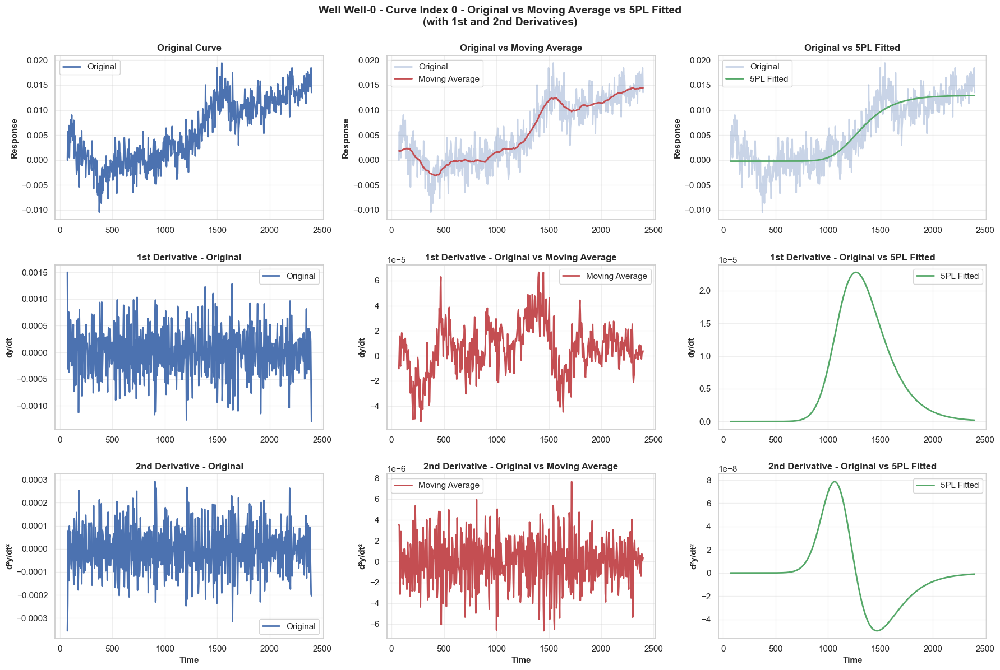

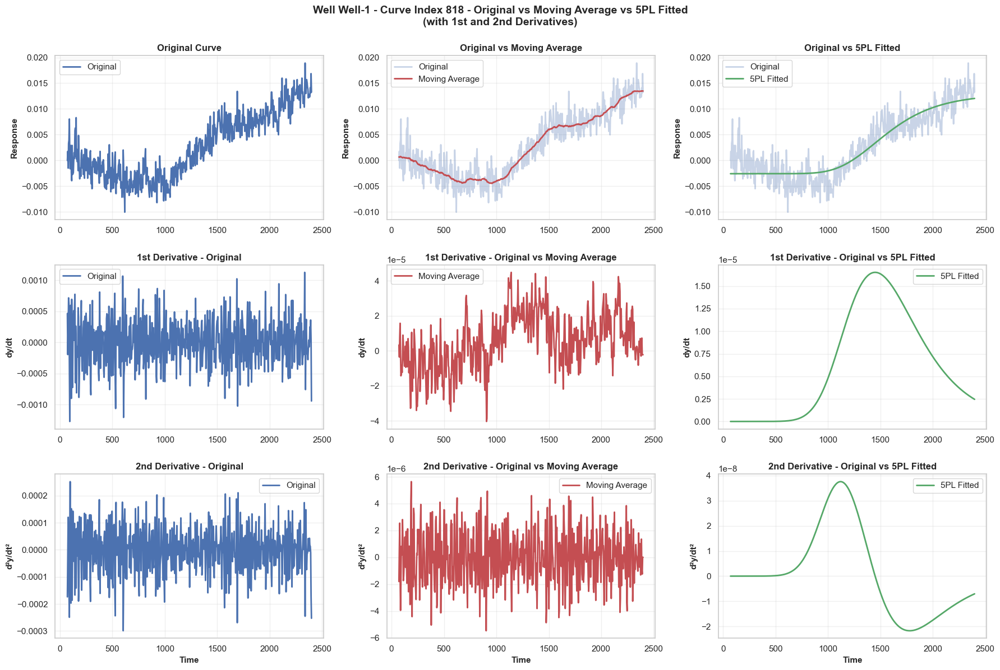

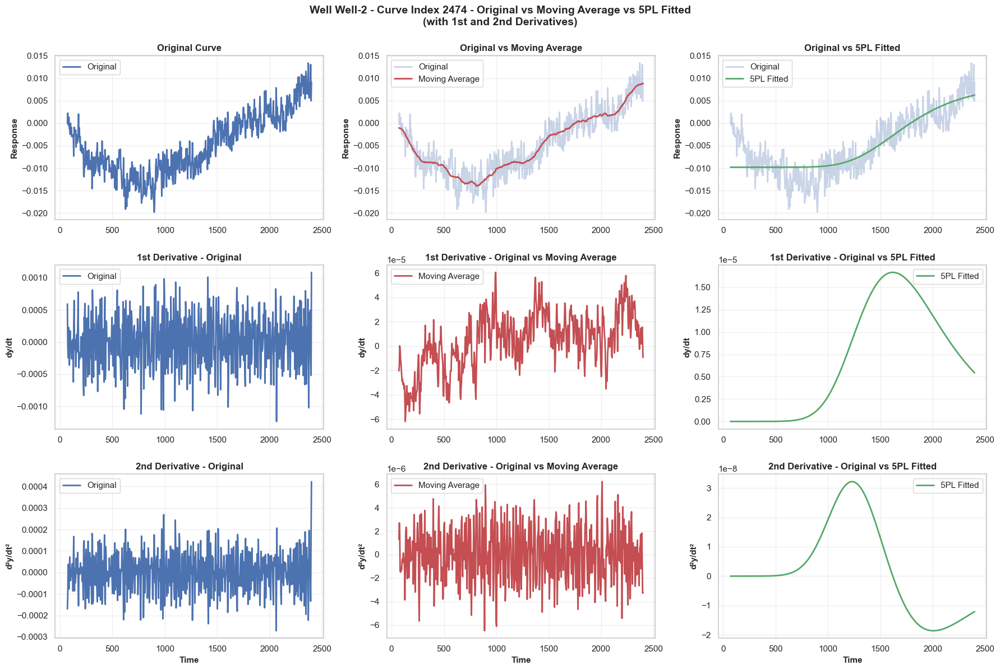

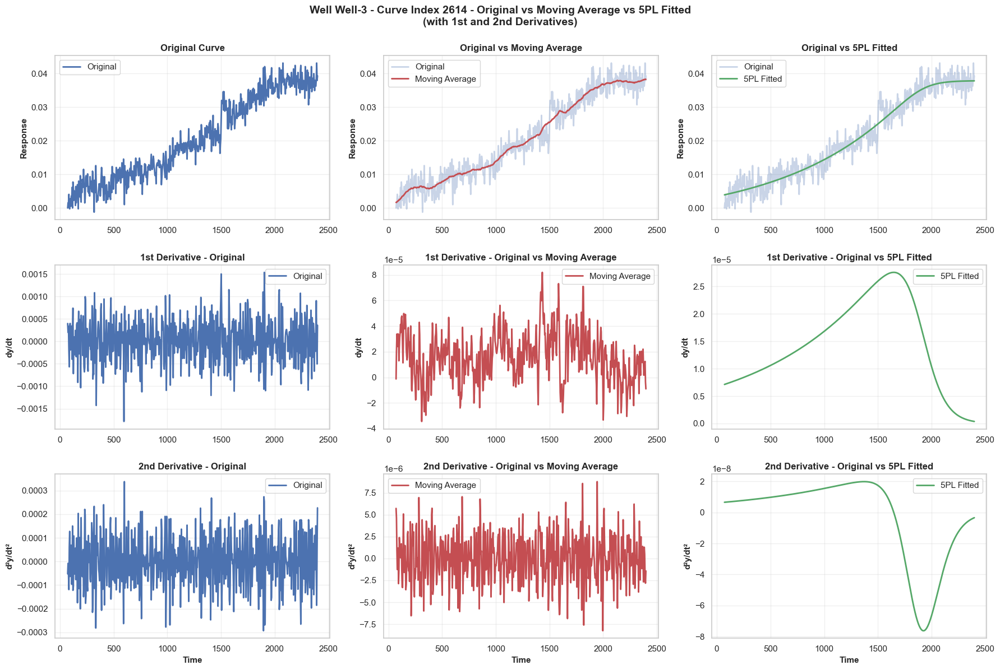

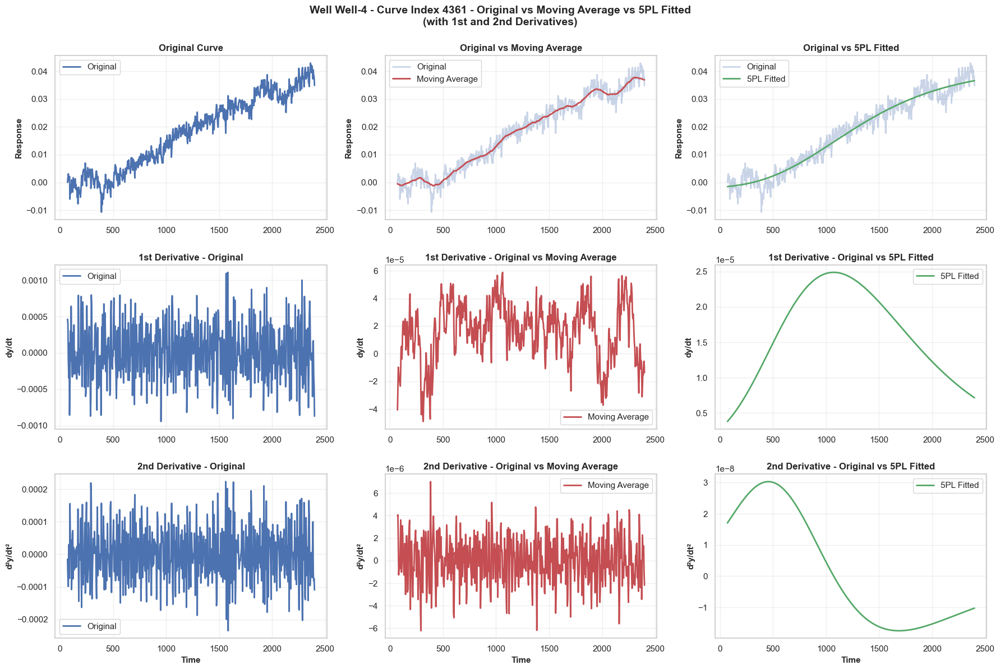

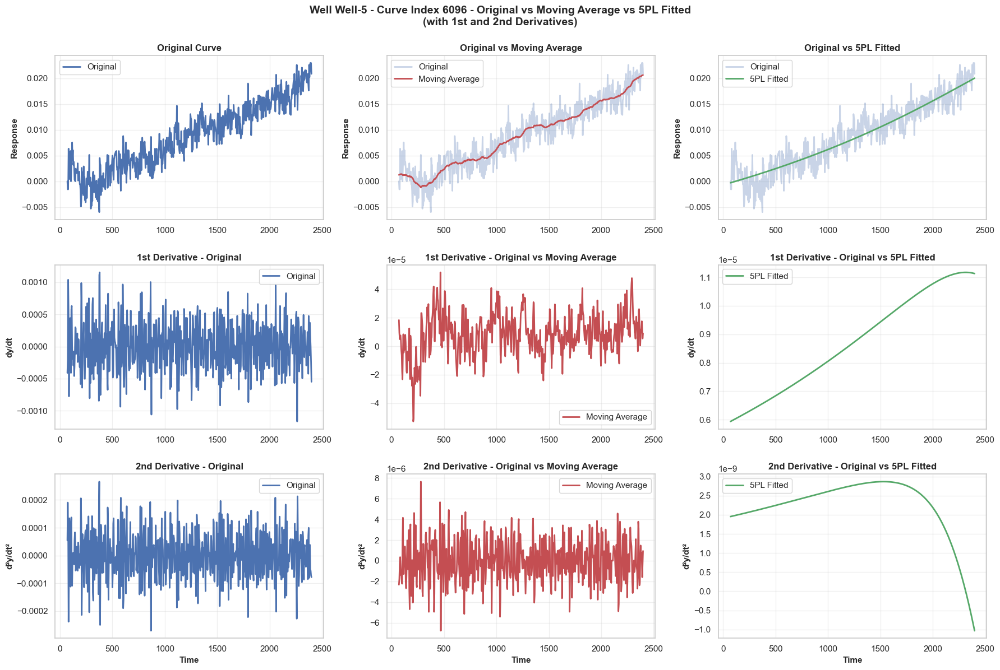

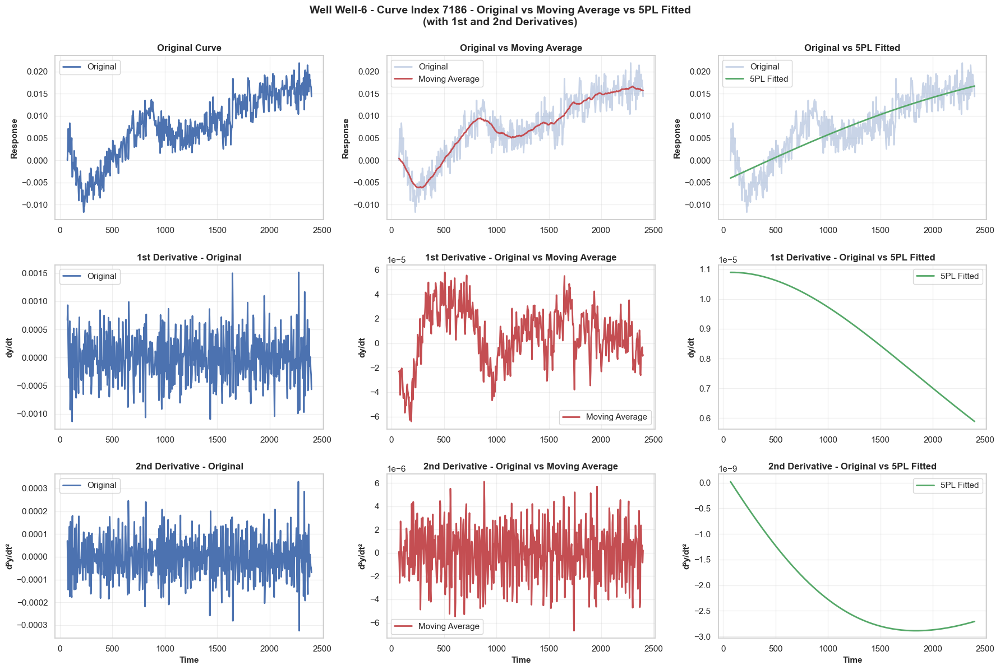

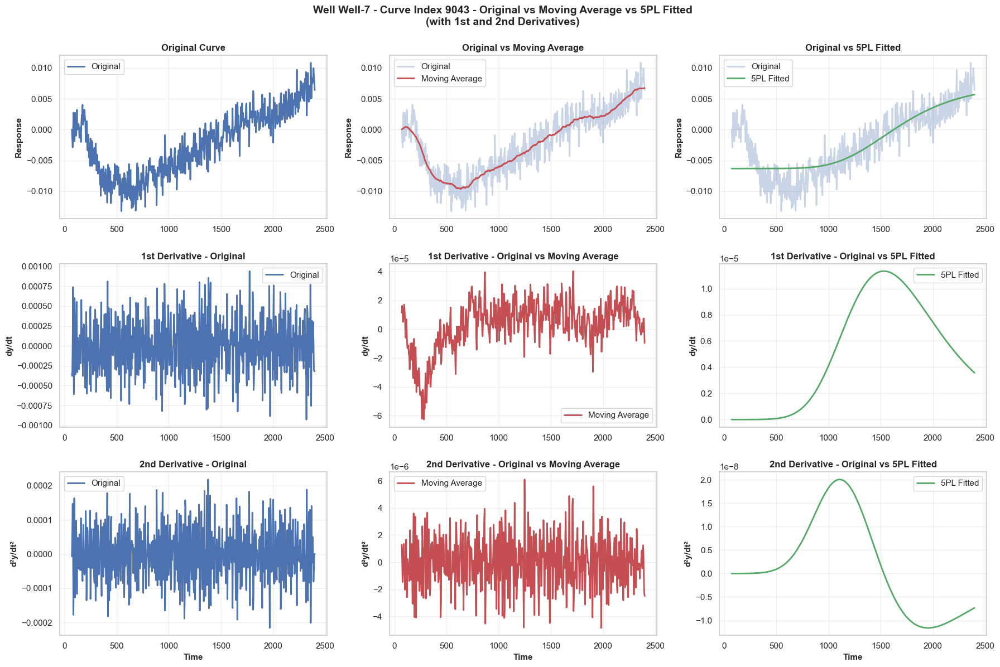

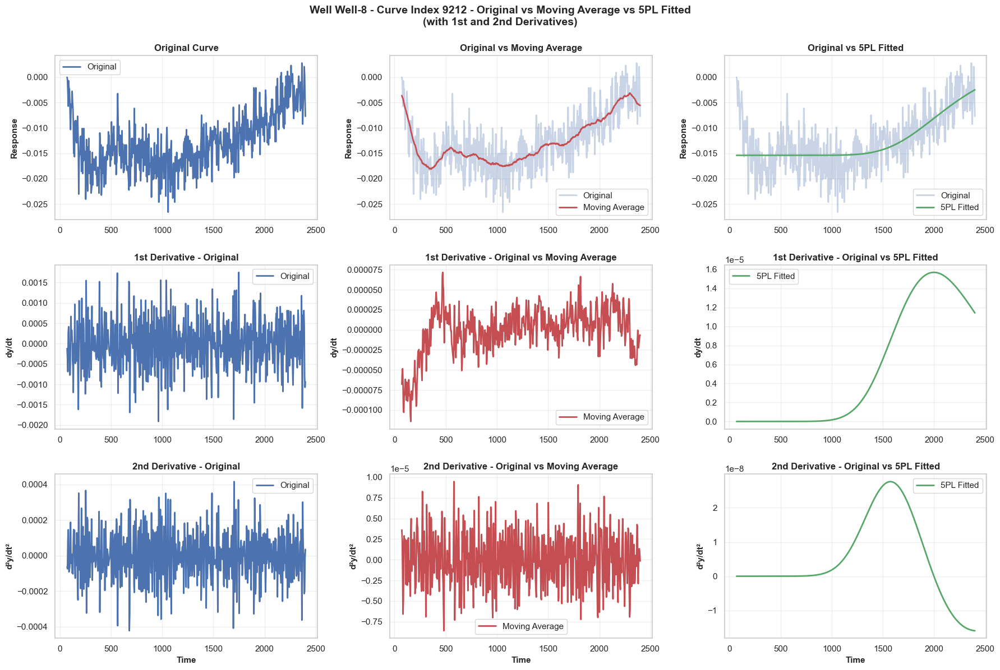

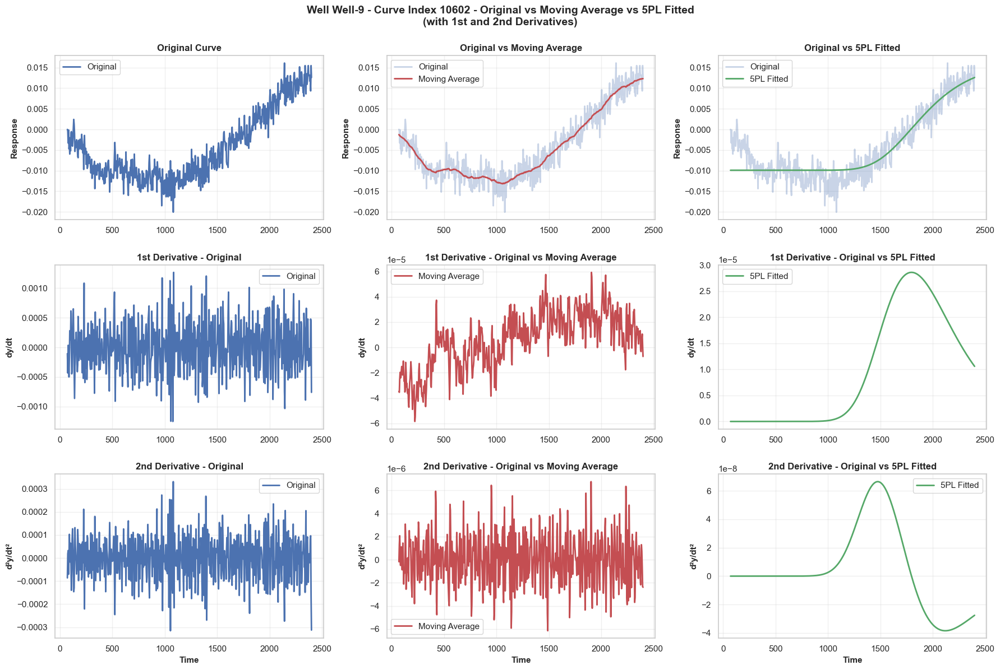

In [46]:
for w in set(Y_well):
    idx = np.where(Y_well == w)[0][0]
    fig, axes = plot_curve_comparison(
    i=idx,
    X_time=X_time,
    X_2d_bs_active=X_2d_bs_active,
    X_2d_bs_active_moving_avg=X_2d_bs_active_moving_avg,
    X_2d_bs_active_5p_fitted=X_2d_bs_active_5p_fitted,
    X_2d_bs_active_1stder=X_2d_bs_active_1stder,
    X_2d_bs_active_moving_avg_1stder=X_2d_bs_active_moving_avg_1stder,
    X_2d_bs_active_5p_1stder=X_2d_bs_active_5p_1stder,
    X_2d_bs_active_2ndder=X_2d_bs_active_2ndder,
    X_2d_bs_active_moving_avg_2ndder=X_2d_bs_active_moving_avg_2ndder,
    X_2d_bs_active_5p_2ndder=X_2d_bs_active_5p_2ndder,
    add_title=f"Well-{w}"
)



Original:
  Total samples: 12047
  NaN samples: 12047
  Valid samples: 0

Moving Average:
  Total samples: 12047
  NaN samples: 8462
  Valid samples: 3585

5PL Fitted:
  Total samples: 12047
  NaN samples: 10468
  Valid samples: 1579


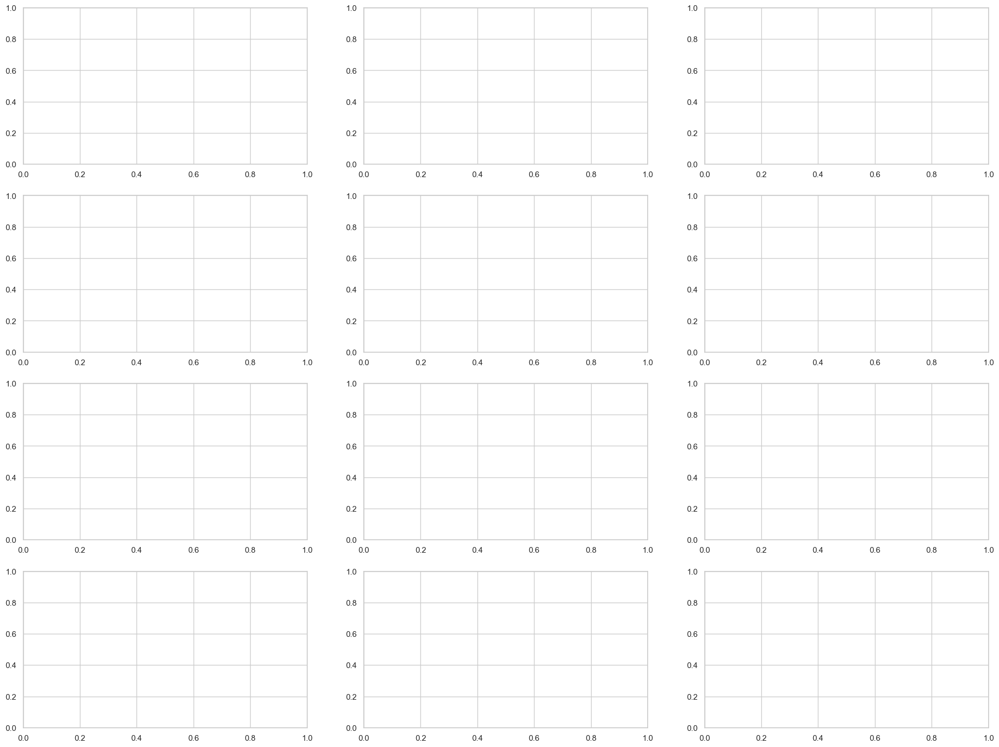

In [49]:
# Data preparation
curve_data = [X_2d_bs_active, X_2d_bs_active_moving_avg, X_2d_bs_active_5p_fitted]
curve_1stder_data = [X_2d_bs_active_1stder, X_2d_bs_active_moving_avg_1stder, X_2d_bs_active_5p_1stder]
curve_2ndder_data = [X_2d_bs_active_2ndder, X_2d_bs_active_moving_avg_2ndder, X_2d_bs_active_5p_2ndder]
curve_features = [X_2d_bs_active_features, X_2d_bs_active_moving_avg_features, X_2d_bs_active_5p_features]
curve_name = ["Original", "Moving Average", "5PL Fitted"]
empty_idx = []
fig, axes = plt.subplots(4, 3, figsize=(24, 18))

n_wells = len(np.unique(Y_well))
colors = plt.cm.tab10(np.arange(n_wells))

for i, cn in enumerate(curve_name):
    
    # ====================================================================
    # FIX 1: Find NaN indices properly for each data type
    # ====================================================================
    
    na_idx_curves = np.unique(np.argwhere(np.isnan(curve_data[i]))[:, 0]) if np.any(np.isnan(curve_data[i])) else np.array([])
    na_idx_1der = np.unique(np.argwhere(np.isnan(curve_1stder_data[i]))[:, 0]) if np.any(np.isnan(curve_1stder_data[i])) else np.array([])
    na_idx_2der = np.unique(np.argwhere(np.isnan(curve_2ndder_data[i]))[:, 0]) if np.any(np.isnan(curve_2ndder_data[i])) else np.array([])
    na_idx_features = np.unique(np.argwhere(np.isnan(curve_features[i]))[:, 0]) if np.any(np.isnan(curve_features[i])) else np.array([])
    
    # Combine all NaN indices
    na_idx = np.unique(np.concatenate((na_idx_curves, na_idx_1der, na_idx_2der, na_idx_features)))
    empty_idx.append(na_idx)
    
    # ====================================================================
    # FIX 2: Create proper mask (inverse of NaN indices)
    # ====================================================================
    
    n_samples = curve_data[i].shape[0]
    mask = np.ones(n_samples, dtype=bool)
    mask[na_idx.astype(int)] = False
    
    print(f"\n{cn}:")
    print(f"  Total samples: {n_samples}")
    print(f"  NaN samples: {len(na_idx)}")
    print(f"  Valid samples: {np.sum(mask)}")
    
    # ====================================================================
    # FIX 3: Filter data BEFORE t-SNE
    # ====================================================================
    
    valid_curves = curve_data[i][mask]
    valid_1der = curve_1stder_data[i][mask]
    valid_2der = curve_2ndder_data[i][mask]
    valid_features = curve_features[i][mask]
    
    # Get corresponding well labels for valid samples
    valid_wells = Y_well[mask]
    
    print(f"  Shapes: curves={valid_curves.shape}, 1der={valid_1der.shape}, 2der={valid_2der.shape}, features={valid_features.shape}")
    
    # ====================================================================
    # FIX 4: Apply t-SNE to valid data
    # ====================================================================
    
    print(f"  Computing t-SNE for {cn}...")
    tsne_data = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42).fit_transform(valid_curves)
    tsne_1der = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42).fit_transform(valid_1der)
    tsne_2der = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42).fit_transform(valid_2der)
    tsne_feature = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42).fit_transform(valid_features)
    
    # ====================================================================
    # ROW 0: ORIGINAL CURVES
    # ====================================================================
    
    ax = axes[0, i]
    for label in range(n_wells):
        well_mask = valid_wells == label
        if np.sum(well_mask) > 0:  # Only plot if samples exist
            ax.scatter(tsne_data[well_mask, 0], tsne_data[well_mask, 1],
                      alpha=0.7, s=40, c=[colors[label]], 
                      label=f'Well-{label+1} (n={np.sum(well_mask)})',
                      edgecolors='black', linewidth=0.5)
    
    ax.set_xlabel('t-SNE 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE 2', fontsize=12, fontweight='bold')
    ax.set_title(f"{cn}", fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8, loc='best')
    
    # ====================================================================
    # ROW 1: 1ST DERIVATIVES
    # ====================================================================
    
    ax = axes[1, i]
    for label in range(n_wells):
        well_mask = valid_wells == label
        if np.sum(well_mask) > 0:
            ax.scatter(tsne_1der[well_mask, 0], tsne_1der[well_mask, 1],
                      alpha=0.7, s=40, c=[colors[label]], 
                      label=f'Well-{label+1} (n={np.sum(well_mask)})',
                      edgecolors='black', linewidth=0.5)
    
    ax.set_xlabel('t-SNE 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE 2', fontsize=12, fontweight='bold')
    ax.set_title(f"{cn} - 1st Derivative", fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8, loc='best')
    
    # ====================================================================
    # ROW 2: 2ND DERIVATIVES
    # ====================================================================
    
    ax = axes[2, i]
    for label in range(n_wells):
        well_mask = valid_wells == label
        if np.sum(well_mask) > 0:
            ax.scatter(tsne_2der[well_mask, 0], tsne_2der[well_mask, 1],
                      alpha=0.7, s=40, c=[colors[label]], 
                      label=f'Well-{label+1} (n={np.sum(well_mask)})',
                      edgecolors='black', linewidth=0.5)
    
    ax.set_xlabel('t-SNE 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE 2', fontsize=12, fontweight='bold')
    ax.set_title(f"{cn} - 2nd Derivative", fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8, loc='best')
    
    # ====================================================================
    # ROW 3: KINETIC FEATURES
    # ====================================================================
    
    ax = axes[3, i]
    for label in range(n_wells):
        well_mask = valid_wells == label
        if np.sum(well_mask) > 0:
            ax.scatter(tsne_feature[well_mask, 0], tsne_feature[well_mask, 1],
                      alpha=0.7, s=40, c=[colors[label]], 
                      label=f'Well-{label+1} (n={np.sum(well_mask)})',
                      edgecolors='black', linewidth=0.5)
    
    ax.set_xlabel('t-SNE 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE 2', fontsize=12, fontweight='bold')
    ax.set_title(f"{cn} - Kinetic Features", fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8, loc='best')

fig.suptitle('t-SNE Visualization: Original vs Moving Average vs 5PL Fitted\n(Curves, 1st Deriv, 2nd Deriv, Kinetic Features)', 
            fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

In [ ]:
print(f"Fo <0: {sum(X_2d_bs_active_5p_fitted[:,0]<0)/len(X_2d_bs_active_5p_fitted)*100:.2f} ({sum(X_2d_bs_active_5p_fitted[:,0]<0)}/{len(X_2d_bs_active_5p_fitted)})")

In [ ]:
slopes = results["5p"]["params"][:,3]

ct_thresholds = 0.2 * X_2d_bs_active_5p_fitted.max(axis=1, keepdims=True)
ct_mask = X_2d_bs_active_5p_fitted > ct_thresholds
outlier_Ct = np.argmax(ct_mask, axis=1)
outlier_Cy0 = np.array(X_2d_bs_active_5p_features["dy_xms"])
outlier_F0 = -np.log10(X_2d_bs_active_5p_fitted[:,0])

outlier_features = np.stack([outlier_Ct, outlier_Cy0, outlier_F0],axis=1)
outlier_features.shape

In [ ]:
Y_well

In [ ]:
X_2d_bs_active_5p_fitted_pos = X_2d_bs_active_5p_fitted - X_2d_bs_active_5p_fitted.min(axis=1, keepdims=True)

epsilon = 1e-9
plt.plot(np.log10(X_2d_bs_active_5p_fitted_pos[:,0] + epsilon))
plt.show()

In [ ]:
print("X_time:", X_time.shape)
print("Y_well:", Y_well.shape)

print("X_2d_bs_active:", X_2d_bs_active.shape)
print("X_2d_bs_active_1stder:", X_2d_bs_active_1stder.shape)
print("X_2d_bs_active_2ndder:", X_2d_bs_active_2ndder.shape)
print("X_2d_bs_active_features:", X_2d_bs_active_features.shape)

print("X_2d_bs_active_moving_avg:", X_2d_bs_active_moving_avg.shape)
print("X_2d_bs_active_moving_avg_1stder:", X_2d_bs_active_moving_avg_1stder.shape)
print("X_2d_bs_active_moving_avg_2ndder:", X_2d_bs_active_moving_avg_2ndder.shape)
print("X_2d_bs_active_moving_avg_features:", X_2d_bs_active_moving_avg_features.shape)

print("X_2d_bs_active_5p_fitted:", X_2d_bs_active_5p_fitted.shape)
print("X_2d_bs_active_5p_1stder:", X_2d_bs_active_5p_1stder.shape)
print("X_2d_bs_active_5p_2ndder:", X_2d_bs_active_5p_2ndder.shape)
print("X_2d_bs_active_5p_features:", X_2d_bs_active_5p_features.shape)

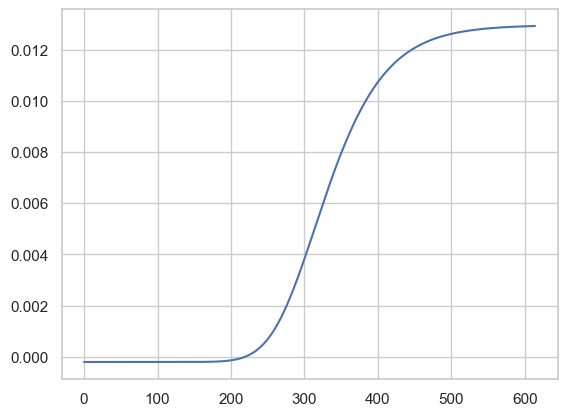

In [54]:
plt.plot(X_2d_bs_active_5p_fitted[0,:])

In [55]:
X_2d_bs_active_5p_features.isna().sum()

xms                             0
xs                             18
xe                             18
xp1                          1262
xp2                          2191
TH                              0
y_xms                           0
y_xs                           18
y_xe                           18
y_xp1                        1262
y_xp2                        2191
dy_xms                          0
dy_xp1                       1262
dy_xp2                       2191
d2y_xp1                      1262
d2y_xp2                      2191
threshold_distance             18
first_half_distance            18
second_half_distance           18
distance_asymmetry_index      254
peak_shifting_distance       3020
A1                             18
A2                             18
area_asymmetry_index          254
peak_asymmetry_index         3020
Ct                              0
Cy0                             0
log_F0                      10058
dtype: int64

In [57]:
X_2d_bs_active_features.isna().sum()

xms                             0
xs                              0
xe                              0
xp1                             0
xp2                             0
TH                              0
y_xms                           0
y_xs                            0
y_xe                            0
y_xp1                           0
y_xp2                           0
dy_xms                          0
dy_xp1                          0
dy_xp2                          0
d2y_xp1                         0
d2y_xp2                         0
threshold_distance              0
first_half_distance             0
second_half_distance            0
distance_asymmetry_index      394
peak_shifting_distance          0
A1                              0
A2                              0
area_asymmetry_index          395
peak_asymmetry_index            0
Ct                              0
Cy0                             0
log_F0                      12047
dtype: int64

In [58]:
X_2d_bs_active_moving_avg_features.isna().sum()

xms                            0
xs                             0
xe                             0
xp1                            0
xp2                            0
TH                             0
y_xms                          0
y_xs                           0
y_xe                           0
y_xp1                          0
y_xp2                          0
dy_xms                         0
dy_xp1                         0
dy_xp2                         0
d2y_xp1                        0
d2y_xp2                        0
threshold_distance             0
first_half_distance            0
second_half_distance           0
distance_asymmetry_index      14
peak_shifting_distance         0
A1                             0
A2                             0
area_asymmetry_index          14
peak_asymmetry_index           0
Ct                             0
Cy0                            0
log_F0                      8448
dtype: int64

In [70]:
sum(X_2d_bs_active_5p_fitted[:,0]<0)

np.int64(9963)

In [82]:
eps = 1e-9
X_2d_bs_active_5p_rb = X_2d_bs_active_5p_fitted - min(X_2d_bs_active_5p_fitted[:,0]) + eps
X_2d_bs_active_5p_rb_params = []
X_2d_bs_active_5p_rb_fitted = []
X_2d_bs_active_5p_rb_rmse = []
X_2d_bs_active_5p_rb_features = []
X_2d_bs_active_5p_rb_1stder = []
X_2d_bs_active_5p_rb_2ndder = []

for i in range(X_2d_bs_active_5p_rb.shape[0]):
    params, result = sp.fit_5p(X_time, X_2d_bs_active_5p_rb[i, :], normalize=True)
    fitted = sp.sigmoid_5p(X_time, *params)
    rmse = np.sqrt(np.nanmean((fitted - X_2d_bs_active_5p_rb[i, :])**2))

    X_2d_bs_active_5p_rb_params.append(params)
    X_2d_bs_active_5p_rb_fitted.append(fitted)
    X_2d_bs_active_5p_rb_rmse.append(rmse)

    dy_dx = sp.sigmoid_5p_first_derivative(X_time, *params)
    d2y_dx2 = sp.sigmoid_5p_second_derivative(X_time, *params)
    
    X_2d_bs_active_5p_rb_1stder.append(dy_dx)
    X_2d_bs_active_5p_rb_2ndder.append(d2y_dx2)
    
    # Extract kinetic parameters
    X_2d_bs_active_5p_rb_features.append(sp.extract_kinetic_parameters(X_time, fitted, params, threshold=0.05))

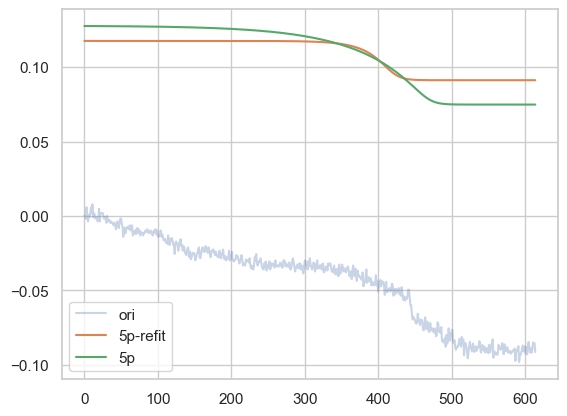

In [98]:
plt.plot(X_2d_bs_active[np.argmax(X_2d_bs_active_5p_rb_rmse)], label="ori", alpha=0.3)
plt.plot(X_2d_bs_active_5p_rb_fitted[np.argmax(X_2d_bs_active_5p_rb_rmse)], label="5p-refit")
plt.plot(X_2d_bs_active_5p_rb[np.argmax(X_2d_bs_active_5p_rb_rmse)], label="5p")
plt.legend()
plt.show()

In [83]:
X_2d_bs_active_5p_rb_fitted = np.asarray(X_2d_bs_active_5p_rb_fitted)
X_2d_bs_active_moving_avg_1stder = np.asarray(X_2d_bs_active_moving_avg_1stder)
X_2d_bs_active_moving_avg_2ndder = np.asarray(X_2d_bs_active_moving_avg_2ndder)
X_2d_bs_active_moving_avg_features = pd.DataFrame(X_2d_bs_active_moving_avg_features)

1.2345076855041054e-09


TypeError: list indices must be integers or slices, not tuple

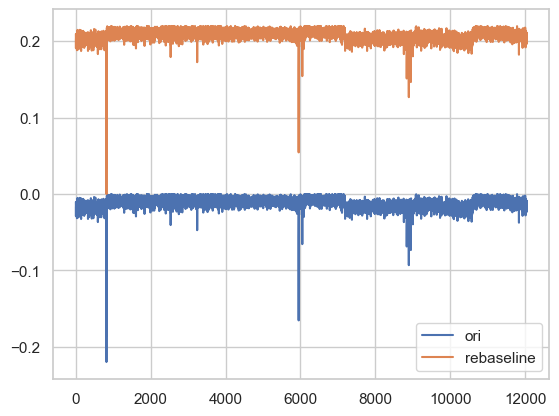

In [109]:
temp = X_2d_bs_active - np.min(X_2d_bs_active)
plt.plot(np.min(X_2d_bs_active, axis=1), label="ori")
plt.plot(np.min(temp, axis=1), label="rebaseline")
plt.legend()
plt.show()

In [112]:
X_2d_bs_active_5p_fitted.shape

(12047, 615)

In [156]:
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data"
folder_names = [name for name in os.listdir(exp_folder) if name != ".DS_Store"] 
exp_paths = [Path(exp_folder, name) for name in os.listdir(exp_folder) if name != ".DS_Store"]

In [204]:
active_pixels_mean = []
active_pixels_std = []
curve_cycles = []
folder_short_names = []
exp_stats = pd.DataFrame(columns = ["exp_name", "Well", "well_nrows", "well_ncols", "well_total_pixels", "temp_nrows", "temp_ncols", "temp_total_pixels", "active_pixels", "total_pixels", "active_percentage", "time_npr_shape", "well_3d_npr_shape", "well_3d_temp_npr_shape", "well_3d_gain_sh"])
for i, path in enumerate(exp_paths):
    sn = "_".join(folder_names[i].split('_')[5:])
    print(sn)
    folder_short_names.append(sn)
    stats = pd.read_csv(Path(path, "well_statistics.csv"))
    stats["exp_name"] = sn
    exp_stats = pd.concat([exp_stats, stats], ignore_index=True)
    active_pixels_mean.append(stats.active_pixels.values.mean())
    active_pixels_std.append(stats.active_pixels.values.std())
    curve_cycles.append((stats.idx_end.values-stats.idx_settled.values).mean())
    print("-"*50)

Sample_14_rep2
--------------------------------------------------
Sample_17
--------------------------------------------------
Sample_11_rep2
--------------------------------------------------
Sample_mix_3
--------------------------------------------------
Sample_6
--------------------------------------------------
Sample_18_wet_3
--------------------------------------------------
Sample_7
--------------------------------------------------
Sample_2_Rep2
--------------------------------------------------
Sample_13
--------------------------------------------------
Sample_15
--------------------------------------------------


In [211]:
wells

array(['Well-1', 'Well-10', 'Well-2', 'Well-3', 'Well-4', 'Well-5',
       'Well-6', 'Well-7', 'Well-8', 'Well-9'], dtype=object)

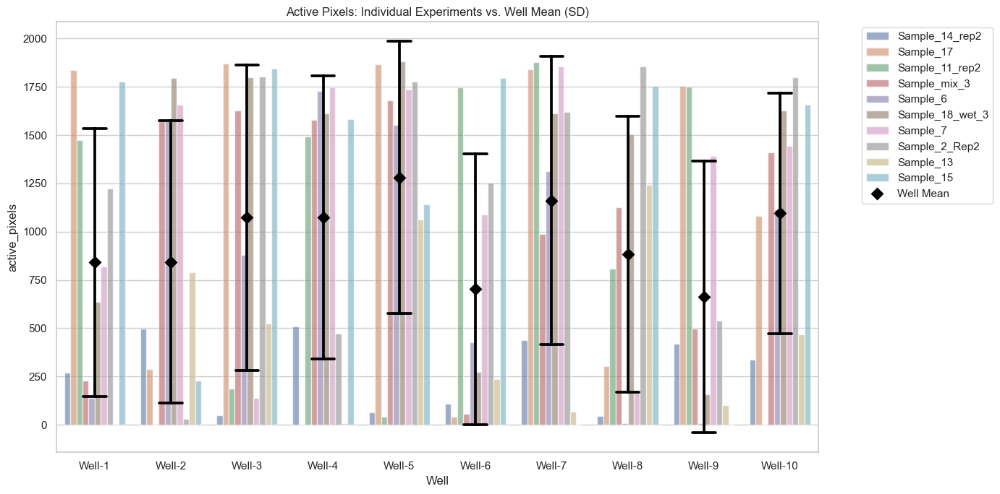

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

# 1. Plot the individual bars (the "multi-bars" per experiment)
sns.barplot(
    data=exp_stats, 
    x='Well', 
    y='active_pixels', 
    hue='exp_name', 
    order=wells, 
    alpha=0.6  # Make them slightly transparent
)

# 2. Overlay the Mean + SD (using a pointplot or a "naked" errorbar)
# We set 'hue' to None here so it calculates the mean for the whole Well
sns.pointplot(
    data=exp_stats, 
    x='Well', 
    y='active_pixels', 
    order=wells, 
    errorbar='sd', 
    color='black', 
    join=False, 
    capsize=0.3,
    markers='D', # Diamond marker for the mean
    label='Well Mean'
)

plt.title("Active Pixels: Individual Experiments vs. Well Mean (SD)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

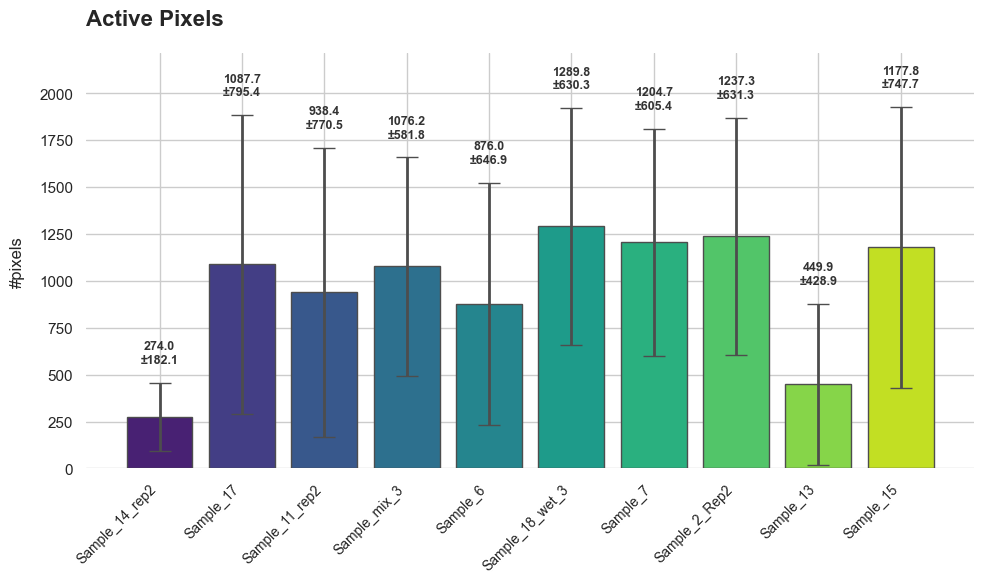

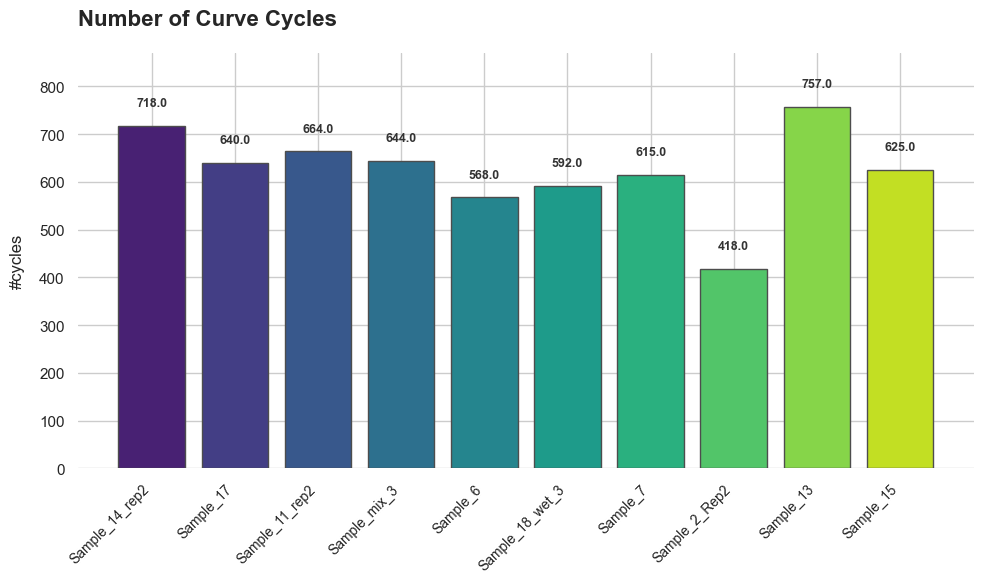

In [251]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def chip_bar_plot(short_names, metric, title, data, data_std=None):
    # Set a clean, professional style
    sns.set_theme(style="whitegrid")
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Use a modern color palette
    palette = sns.color_palette("viridis", len(short_names))
    
    # Standardize data_std to a list/array if it's empty
    has_std = data_std is not None and len(data_std) > 0
    yerr = data_std if has_std else None

    # Plot bars
    bars = ax.bar(
        short_names, data, yerr=yerr, 
        capsize=8, color=palette, edgecolor='0.3', linewidth=1,
        error_kw={'elinewidth': 2, 'ecolor': '0.3'}
    )

    # Dynamic Y-limit to leave room for labels
    if has_std:
        upper_limit = max(np.array(data) + np.array(data_std)) * 1.15
        custom_labels = [f'{a:.1f}\n±{s:.1f}' for a, s in zip(data, data_std)]
    else:
        upper_limit = max(data) * 1.15
        custom_labels = [f'{a:.1f}' for a in data]
    
    ax.set_ylim(0, upper_limit)

    # Improved bar labels (centered and slightly smaller)
    ax.bar_label(bars, labels=custom_labels, padding=12, fontsize=9, fontweight='bold', color='0.2')
    
    # Remove top and right spines for a "breathing" plot
    sns.despine(left=True, bottom=True)

    # Titles and Labels
    ax.set_title(title, fontsize=16, pad=20, fontweight='bold', loc='left')
    ax.set_ylabel(metric, fontsize=12, labelpad=10)
    
    # Better X-axis readability
    plt.xticks(rotation=45, ha='right', fontsize=10)
    
    plt.tight_layout()
    plt.show()

chip_bar_plot(folder_short_names, "#pixels", "Active Pixels", active_pixels_mean, active_pixels_std)
chip_bar_plot(folder_short_names, "#cycles", "Number of Curve Cycles", curve_cycles)

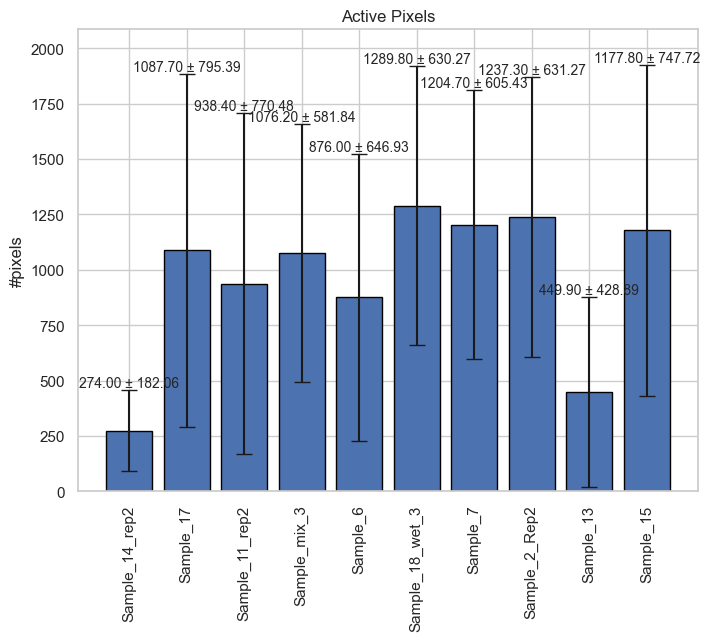

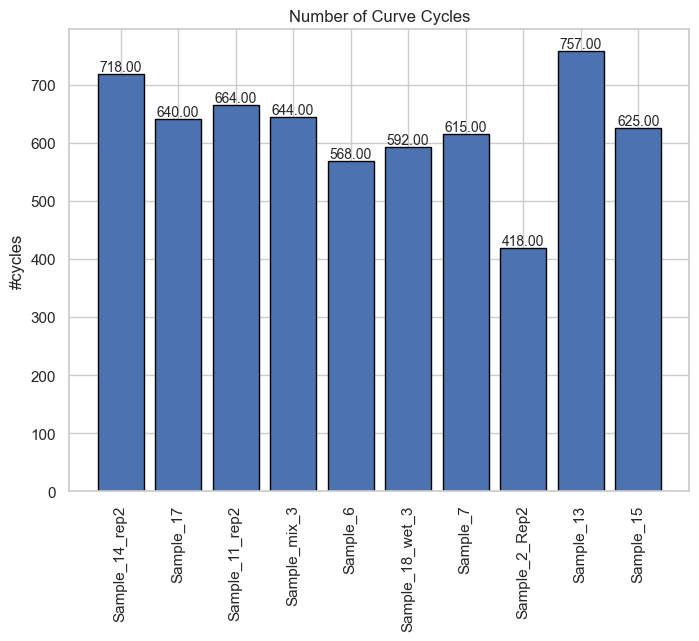

In [249]:
def chip_bar_plot(short_names, metric, title, data, data_std=[]):
    fig, ax = plt.subplots(figsize=(8, 6))

    if(len(data_std)>0):
        custom_labels = [f'{a:.2f} ± {s:.2f}' for a, s in zip(data, data_std)]
        bars = ax.bar(short_names, data, yerr=data_std, capsize=6, edgecolor='black')
        ax.set_ylim(0, max(data) + max(data_std))
    else:
        custom_labels = [f'{a:.2f}' for a in data]
        bars = ax.bar(short_names, data, capsize=6, edgecolor='black')
        ax.set_ylim(0, max(data)*1.05)
    
    ax.bar_label(bars, labels=custom_labels, padding=0, fontsize=10)
    
    ax.set_ylabel(metric)
    ax.set_title(title)

    plt.xticks(rotation=90)
    plt.show()

chip_bar_plot(folder_short_names, "#pixels", "Active Pixels", active_pixels_mean, active_pixels_std)
chip_bar_plot(folder_short_names, "#cycles", "Number of Curve Cycles", curve_cycles)

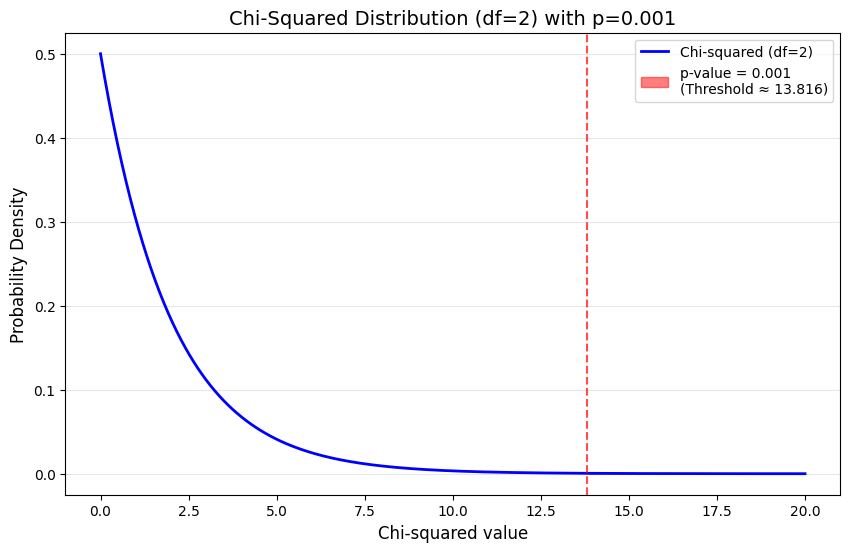

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2

# Parameters
df = 2
p_value = 0.001
x_max = 20  # Range for x-axis

# Calculate the critical value (threshold)
threshold = chi2.ppf(1 - p_value, df)

# Generate distribution data
x = np.linspace(0, x_max, 500)
pdf = chi2.pdf(x, df)

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(x, pdf, label=f'Chi-squared (df={df})', color='blue', lw=2)

# Shade the p-value area
x_tail = np.linspace(threshold, x_max, 100)
plt.fill_between(x_tail, chi2.pdf(x_tail, df), color='red', alpha=0.5, 
                 label=f'p-value = {p_value}\n(Threshold ≈ {threshold:.3f})')

# Add vertical line for threshold
plt.axvline(threshold, color='red', linestyle='--', alpha=0.7)

# Labels and Title
plt.title(f'Chi-Squared Distribution (df={df}) with p={p_value}', fontsize=14)
plt.xlabel('Chi-squared value', fontsize=12)
plt.ylabel('Probability Density', fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Display the plot
plt.show()